# Design & Implement Neural network models (Perceprton,SVM,LVQ,SOM)

## Using Artificial Neural Network

## Dataset - Real estate valuation

<bold>Dataset link<bold> - <a href='https://archive.ics.uci.edu/ml/datasets/Real+estate+valuation+data+set'>UCI Machine Learning repo real estate dataset<a>

<table>
    <tr>
        <th>Data Set Characteristics: </th>
        <td>Multivariate </td>
        <th>Number of Instance </th>
        <td>414 </td>
        <th>Area </th>
        <td>Business </td>
    </tr>
    <tr>
        <th>Attribute Characteristics </th>
        <td>Integer,real </td>
        <th>No. of Attributes </th>
        <td>7 </td>
        <th>Date donated </th>
        <td>2018-08-18 </td>
    </tr>
    <tr>
        <th>Associated Task </th>
        <td>Regression </td>
        <th>Missing values </th>
        <td>N/A </td>
        <th>Number of Web hits </th>
        <td>33560 </td>
    </tr>
</table>

In [2]:
import pandas as pd
import numpy as np
real_state = pd.read_excel('Dataset.xlsx')

In [3]:
real_state.head()

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
0,1,2012.916667,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.916667,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583333,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500000,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833333,5.0,390.56840,5,24.97937,121.54245,43.1


In [4]:
real_state.describe()

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
count,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000,414.000000
mean,207.500000,2013.148953,17.712560,1083.885689,4.094203,24.969030,121.533361,37.980193
std,119.655756,0.281995,11.392485,1262.109595,2.945562,0.012410,0.015347,13.606488
min,1.000000,2012.666667,0.000000,23.382840,0.000000,24.932070,121.473530,7.600000
25%,104.250000,2012.916667,9.025000,289.324800,1.000000,24.963000,121.528085,27.700000
50%,207.500000,2013.166667,16.100000,492.231300,4.000000,24.971100,121.538630,38.450000
75%,310.750000,2013.416667,28.150000,1454.279000,6.000000,24.977455,121.543305,46.600000
max,414.000000,2013.583333,43.800000,6488.021000,10.000000,25.014590,121.566270,117.500000


In [8]:
real_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 414 entries, 0 to 413
Data columns (total 8 columns):
No                                        414 non-null int64
X1 transaction date                       414 non-null float64
X2 house age                              414 non-null float64
X3 distance to the nearest MRT station    414 non-null float64
X4 number of convenience stores           414 non-null int64
X5 latitude                               414 non-null float64
X6 longitude                              414 non-null float64
Y house price of unit area                414 non-null float64
dtypes: float64(6), int64(2)
memory usage: 26.0 KB


# Perceptron Model

In [9]:
class Perceptron(object):
    def __init__(self, eta=0.01, n_iter=20):
        self.eta = eta #learning rate
        self.n_iter = n_iter # Passes over the training dataset
        
    def fit(self, X, y):
        self.w_ = np.zeros(1 + X.shape[1])
        k = 1
        for _ in range(self.n_iter):
            print("iteration : ", k)
            flag = 0
            for xi, target in zip(X, y):
                ypredict = [self.predict(xi)]
                error = target-self.predict(xi)
                if error!=0:
                    flag=1
                    update = self.eta*error
                    self.w_[1:] += update*xi
                    self.w_[0] += update
                print(self.w_)
            
            k+=1
            if flag==0:
                break
            
        return self
    
    def net_input(self, X):
        """Calculate net Input"""
        y = np.dot(X, self.w_[1:])+self.w_[0]
        #print(y)
        return y
    
    def predict(self, X):
        z = self.net_input(X)
        return (z**(1/3)*5)

iteration :  1
[37.9         7.64584009 20.28030891  2.38932503  5.96924594 29.03991375
  9.05554186]
[59.57499945  8.91083028 40.16950316  2.97316666  7.58975287 36.92433877
 11.79311037]
[83.06762317  9.45174538 63.02558593  3.1765182   8.60600056 41.86756704
 13.71681595]
[111.00738861  10.09431851  90.17717524   3.41808704   9.81323893
  47.73981143  16.36441049]
[124.24613628  10.25493381 102.72342755   3.57870234  10.61565275
  51.64412689  17.74891439]
[125.70738919  10.25969553 104.18214215   3.58071434  10.63239457
  51.72562099  17.77044271]
[134.95609131  10.75986236 113.22099921   3.68219746  10.99453464
  53.48760612  18.35469557]
[149.64751139  11.69949324 126.53332377   3.95992087  12.15080922
  59.11346222  20.51630945]
[135.82895381  11.62004392 112.71857153   3.95741459  12.08827496
  58.80898693  20.46919125]
[126.313622    11.52476918 103.22739718   3.94144675  11.95538367
  58.16221054  20.35156153]
[136.45306756  12.35069411 112.84451932   3.96518023  12.54809137


[328.6375835   63.18137006 -60.24682529  52.07649176 182.23300019
 886.73335966 511.51589023]
[314.36958493  62.6435032  -73.97130054  51.83338809 181.47422958
 883.0398583  510.71060934]
[315.04827485  62.66082244 -73.31552563  51.84004934 181.50748939
 883.2017764  510.76456544]
[296.87241309  61.53445287 -87.83279963  51.75471831 179.37645703
 872.83151016 508.26436631]
[297.29640546  61.5624751  -87.43129986  51.76185124 179.40190432
 872.95535817 508.30614491]
[292.63311137  61.51099674 -88.23377327  51.52161892 178.54503957
 868.78420373 506.60049544]
[287.584074    61.30971776 -93.09293873  51.46892809 178.28206753
 867.50339603 506.24219778]
[283.70588533  61.27215707 -96.96439775  51.4636129  178.23783942
 867.28810879 506.19312083]
[282.50325747  61.27215707 -97.98083923  51.43434741 178.11611364
 866.69529525 505.97850728]
[281.46611963  61.27042796 -99.01448015  51.43235229 178.09950737
 866.61448177 505.95782449]
[280.68170932  61.26247606 -99.6517734   51.41160821 178.013

[ 263.9401173    49.7309377  -164.74621694   66.01785906  221.79769597
 1079.13223723  719.45918642]
[ 292.39276895   51.07431348 -136.74101859   66.15706899  222.66700558
 1083.3619488   721.6482625 ]
[ 305.23802264   51.19418572 -124.63195353   66.31479562  223.45503467
 1087.19609123  723.3832555 ]
[ 312.9798438    52.86904328 -119.56312895   66.55811633  224.46752215
 1092.12497355  725.84485002]
[ 306.10635053   51.83603682 -125.38104546   66.37029698  223.79725229
 1088.86384944  724.74476522]
[ 304.25849103   51.73692052 -127.17427028   66.34350879  223.71360309
 1088.4568815   724.61919558]
[ 303.3801048    51.73528721 -128.05110283   66.3422838   223.70341002
 1088.40726447  724.60665993]
[ 300.85408904   51.60106134 -130.48714133   66.31705338  223.57738742
 1087.79397019  724.41743173]
[ 298.14077583   51.47770989 -133.04595552   66.26223051  223.40615779
 1086.96106815  724.14674382]
[ 291.56356445   50.52604517 -138.37324354   66.09127278  222.69480152
 1083.49797421  722.

 1123.00582395  882.17427994]
[ 242.39707777   16.59578341 -140.71904453   69.56444243  230.79561214
 1122.74140299  882.13467232]
[ 239.35580082   16.39111894 -143.66406818   69.53609555  230.65408723
 1122.05236076  881.93794498]
[ 235.79868836   16.16017225 -147.10669846   69.49581416  230.48633212
 1121.23637368  881.70901236]
[ 251.72060942   16.23827983 -131.67390816   69.61152909  231.20881131
 1124.75259314  883.26827104]
[ 251.01597875   16.18742907 -132.35305666   69.60041416  231.17411865
 1124.58372283  883.21505836]
[ 253.38872806   16.294103   -130.07228778   69.64465681  231.29686889
 1125.18121771  883.42152404]
[ 277.22270447   17.59739395 -106.81129981   69.75356692  232.2035684
 1129.59342571  885.65418123]
[ 261.18100005   17.51313804 -122.84690167   69.75356692  232.11671226
 1129.17042004  885.60752714]
[ 246.5319181    17.41768904 -137.49007409   69.75032035  232.0357129
 1128.77597729  885.56467248]
[ 252.17450252   17.64886297 -132.02980223   69.79293306  232.3

[ 211.32678964  -24.06745983 -115.96768722   71.5839225   232.20355455
 1129.39879948 1027.93212084]
[ 210.14181078  -24.09922536 -116.37217689   71.51876244  232.0002685
 1128.40887504 1027.46948436]
[ 210.79796194  -24.05865174 -115.73269346   71.52746455  232.02743082
 1128.54108884 1027.51016676]
[ 234.73562775  -24.05865174  -94.20442215   71.96831984  233.86267022
 1137.47168387 1032.63143562]
[ 242.15735495  -23.73126474  -87.48660814   72.08441452  234.44272637
 1140.29379415 1033.86900491]
[ 236.15767452  -23.98655929  -91.71642082   71.79720815  233.64547404
 1136.41523774 1032.35957587]
[ 236.52762555  -23.98485194  -91.34671472   71.79720815  233.64808556
 1136.42796599 1032.36264492]
[ 237.09239378  -23.95345692  -90.80068475   71.80152361  233.67503398
 1136.55909025 1032.40612325]
[ 221.50800985  -24.01512749 -106.37762405   71.80152361  233.57949068
 1136.09367505 1032.35671018]
[ 212.37488675  -25.0748889  -111.17761531   71.22241902  232.13271367
 1129.05522272 1029.6

[ 196.80072602  -65.83988171  -82.18501205   73.77527213  237.58278789
 1155.40541274 1179.04421997]
[ 186.89562441  -65.94922466  -83.88951116   73.26500504  235.76275847
 1146.54564373 1175.4213236 ]
[ 181.45453781  -66.16613261  -89.12598261   73.20822285  235.4793671
 1145.16538346 1175.03520473]
[ 181.290583    -66.16772053  -89.28965292   73.20799815  235.4774973
 1145.15628195 1175.03312995]
[ 176.91595986  -66.16772053  -92.98701312   73.10154338  235.03471327
 1142.99989099 1174.25246169]
[ 178.7506846   -66.16466169  -91.15847451   73.10507281  235.06409019
 1143.14285221 1174.28905011]
[ 174.50013147  -66.20775133  -94.61183143   72.99266507  234.59636514
 1140.86582994 1173.4384982 ]
[ 177.92038415  -66.16851703  -91.37481784   73.06779457  234.80490108
 1141.88039434 1173.81247613]
[ 173.97148894  -66.17392166  -95.30883827   73.06509225  234.73747515
 1141.55193102 1173.74329695]
[ 170.06695312  -66.23988398  -99.20489015   73.06115421  234.68827564
 1141.31265822 1173.69

Accuracy: 0.56


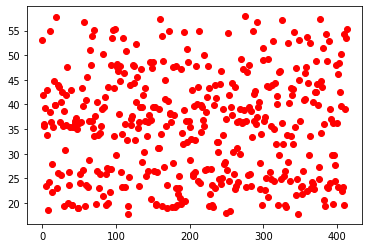

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import preprocessing

data = pd.read_excel('Dataset.xlsx')
y = data.iloc[:, -1].values
data = data.drop(["No"], axis = 1)
data =data.drop(["X1 transaction date"], axis=1)
normalized_X = data
X = preprocessing.normalize(normalized_X)
ppn = Perceptron(eta = 1, n_iter = 10)
ppn.fit(X, y)
out = ppn.predict(X)
#print('output:',out )
plt.plot(out,'ro')

from sklearn.metrics import r2_score
print("Accuracy: %.2f"%r2_score(y,out))

# SVM

[158.83489261 140.10019869 138.82307359 138.51675186  63.38417255
 180.00822675 174.04081209 174.04081209  62.17143891 185.06422346
  79.27625526  63.64729338  98.8114263   62.30571637 145.0065103
  73.49312765 178.41468677 139.83733435  63.67403126 164.90001613
  62.02745623  75.50479557 171.84069841 153.95805917  34.45074866
 138.49488116  30.44720717 138.82307359 153.43581216 163.23229521
  27.56675147  87.67864756 149.19746925  59.73248852 180.09058764
 124.5175233  185.06422346  31.31331017 173.45052242 181.98871449
 142.16494249 152.56029524 178.84399278 137.09854246 140.10019869
 183.57204955 171.18171669  57.90677427 172.70559984 178.79242469
 158.83489261 172.38216871 170.3301675  175.97983186 137.48829499
  31.31331017 133.45419682 103.25052719  63.38417255 174.04081209
  63.32938309  97.18255232  31.31331017  27.81876328  69.38492213
  75.50479557  60.3604737  172.0018971  139.76396134  60.3604737
 169.67414693 146.89125713 139.83733435 156.19587225 153.5186947
 138.57547725

C:\Users\HP\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


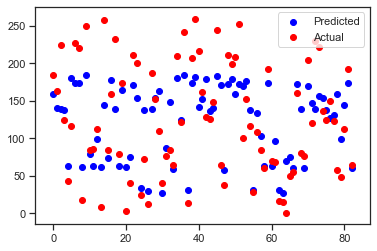

In [19]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from math import sqrt
data=pd.read_excel('Dataset.xlsx')
data=data.drop(columns='No')
x=data.iloc[:,2:6].values
y=data.iloc[:,-1].values

from sklearn.preprocessing import LabelEncoder
lab_enc=LabelEncoder()
y_new=lab_enc.fit_transform(y)

scaler = StandardScaler()
x = scaler.fit_transform(x)

from sklearn.model_selection import train_test_split
x_train,x_test ,y_train,y_test=train_test_split(x,y_new,test_size=0.2,random_state=42)
from sklearn.svm import SVR
sc=SVR(kernel='rbf',degree=4,C=6)
sc.fit(x_train,y_train)
y_pred=sc.predict(x_test)

print(y_pred)

rmse = sqrt(mean_squared_error(y_test, y_pred))
print('root mean square error %.2f'%sqrt(mean_squared_error(y_test, y_pred)))

from sklearn.metrics import r2_score
print('r2 score value: %.2f'%r2_score(y_test, y_pred))

plt.scatter(np.arange(len(y_pred)),(y_pred), c='blue', label='Predicted')
plt.scatter(np.arange(len(y_test)),(y_test), c='red', label='Actual')
plt.legend()

# SOM

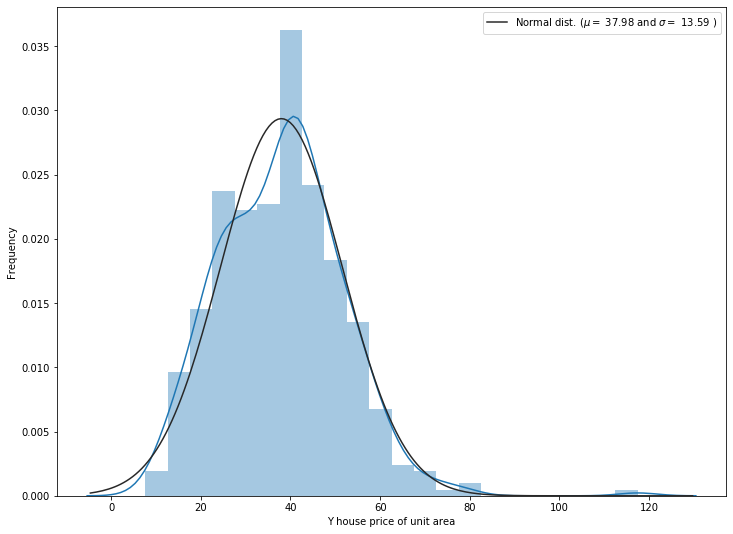

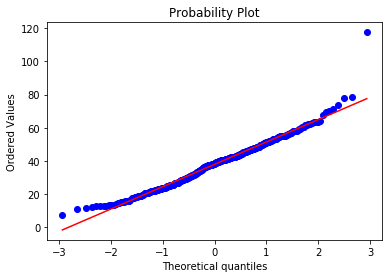

In [11]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import StandardScaler
data=pd.read_excel('Dataset.xlsx')
data=data.drop(columns=['No','X1 transaction date'])
plt.subplots(figsize=(12,9))
sns.distplot(data['Y house price of unit area'], fit=stats.norm)

# Get the fitted parameters used by the function
(mu, sigma) = stats.norm.fit(data['Y house price of unit area'])

# plot with the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)], loc='best')
plt.ylabel('Frequency')

#Probablity plot
fig = plt.figure()
stats.probplot(data['Y house price of unit area'], plot=plt)
plt.show()

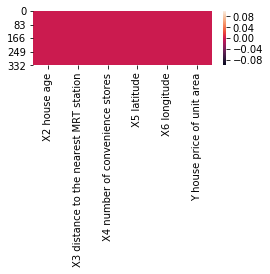

In [12]:
#plot of missing value attributes
plt.figure(figsize=(4,1))
sns.heatmap(data.isnull())
plt.show()

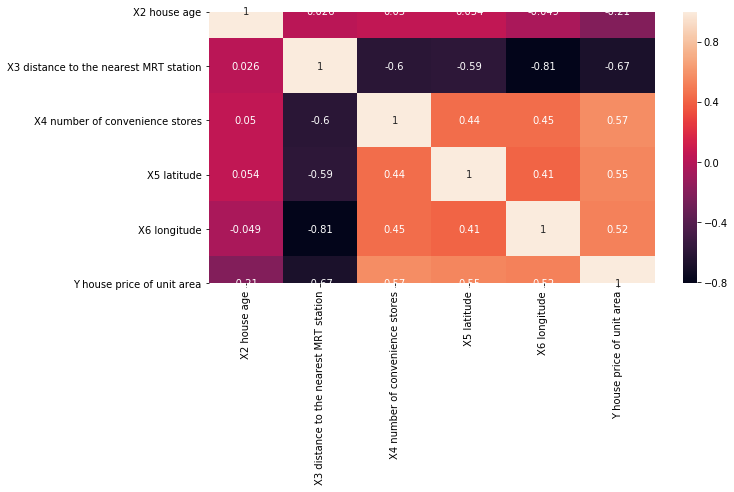

In [13]:
#Corrlation plot
corr = data.corr()
plt.subplots(figsize=(10,5))
sns.heatmap(corr, annot=True)

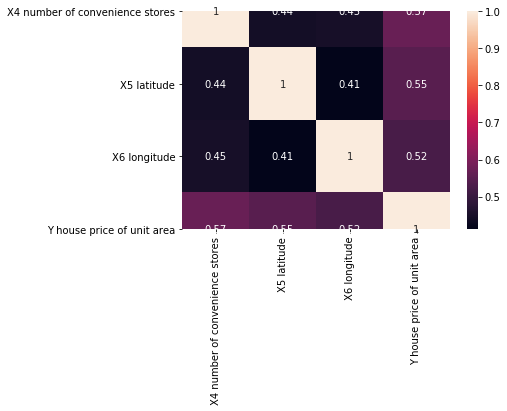

In [14]:
#having more than 50% corelation
top_feature = corr.index[abs(corr['Y house price of unit area']>0.5)]
plt.subplots(figsize=(6,4))
top_corr = data[top_feature].corr()
sns.heatmap(top_corr, annot=True)
plt.show()

C:\Users\HP\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


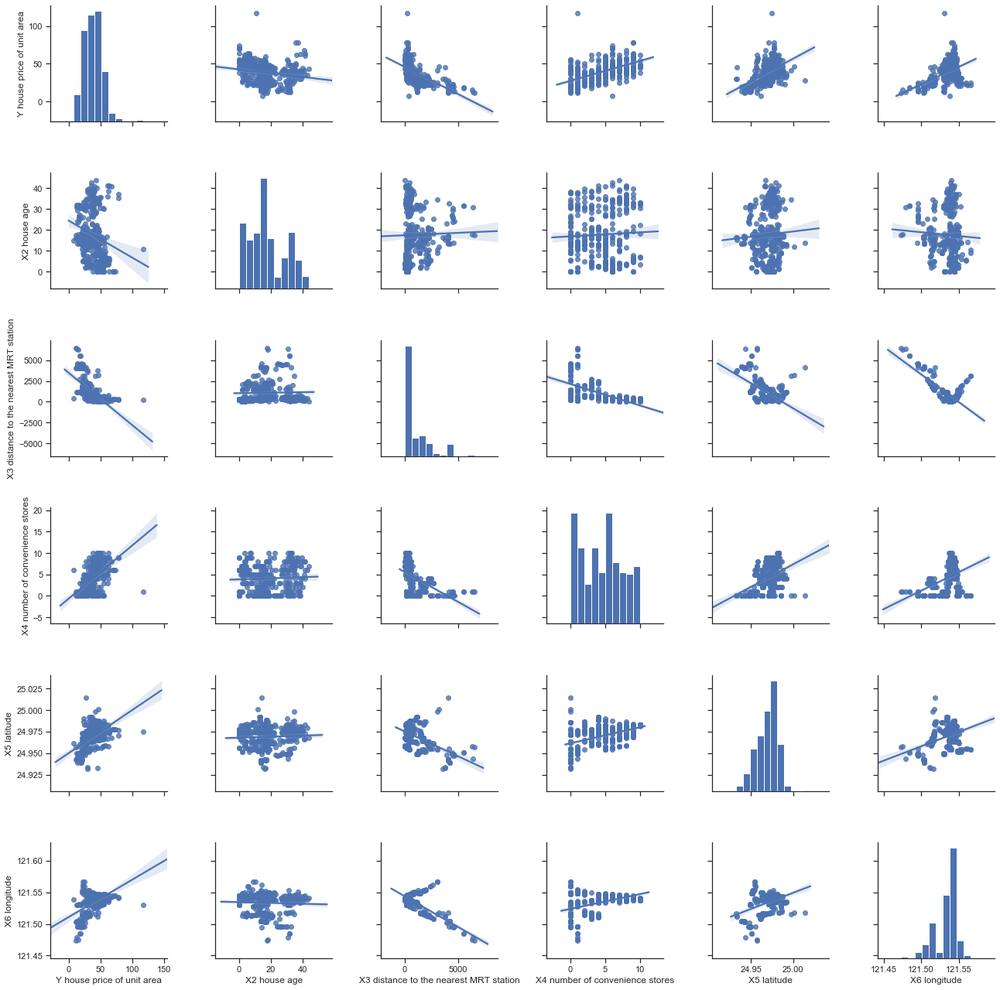

In [15]:
col = [ 'Y house price of unit area','X2 house age', 'X3 distance to the nearest MRT station', 'X4 number of convenience stores', 'X5 latitude', 'X6 longitude']
sns.set(style='ticks')
sns.pairplot(data[col], size=3, kind='reg')

In [16]:
"""scaler = StandardScaler()
data = scaler.fit_transform(data)"""
from sklearn.metrics import r2_score
data=np.array(data)
max=np.max(data)
data=data
x=data[:,:-1]
x=x/max
y=data[:,-1]
w = np.random.rand(x.shape[1],6)
#print(w)
lr=0.2
epoch=100
for iter in range(epoch):
    for i in range(x.shape[0]):
        temp=[]
        for j in range(w.shape[1]):
            sum=0
            for k in range(w.shape[0]):
                sum=sum+((x[i][k]-w[k][j])**2)
            temp.append(sum)
        xx = np.array(temp)
        index = xx.argmin()
        #print("neuron at position",index," won")
        for p in range(w.shape[0]):
            w[p][index]=w[p][index]+lr*(x[i][p]-w[p][index])
    lr=lr*0.2    
final=(np.dot(x,w))*max


r=[]
for i in range(6):
    value=(r2_score(final[:,i],y,multioutput='variance_weighted'))
    r.append(value)
r=np.array(r)

some = np.argmax(r)
print(final[:,some])

#final=pd.DataFrame(final)
#print(final.head())

#y=pd.DataFrame(y)
#print(y.head())"""

[ 11.71427297  35.83832532  63.64643252  63.64643252  44.9464825
 239.38629937  70.40439739  33.76900308 603.05311027 196.71908009
  46.61916126  12.25233037  56.04506045 271.52410647 129.33263981
  65.58115893  34.3024423   40.64992769  42.53630452   4.92962911
 250.36766571  32.82492474 150.61480137  32.82385148  54.85907742
 164.57163105  44.21072697  32.52628742  63.1703636   51.56342199
 494.91009296  86.2918897   55.71038302  37.68711554  24.79613955
 446.90621473 213.25316654 150.60755683  65.36063795  33.9449881
 447.18783083 445.51536915  59.07408123  58.34315214  60.51102043
  55.73888734  52.99117126  72.28664604 504.28257485 493.90347268
  58.28155042 194.05489006 159.20928459  56.0458654   33.94471979
 128.92093098  42.92027577   8.54054641 493.90588753  39.02850307
 212.82897182  30.68423345 239.50568894  60.51075212 110.91816592
  15.96928476  23.47286667  13.81936212  53.04071722  63.64428599
  12.25313531  72.28557278  48.72433853 447.18836747  43.75501048
 150.6083617

# LVQ

In [17]:
import numpy as np
import pandas as pd

def LVQ(X, T, lr=0.01, epoch=20):
    W_ = np.random.uniform(size = (4,4))
    for iter in range(epoch):
        for i in range(X.shape[0]):
            temp=[]
            print("for inputs" ,X[i,:] ," Target is: ",T[i])
            for j in range(W_.shape[1]):
                sum=0
                for k in range(W_.shape[0]):
                    sum =sum+((X[i][k]-W_[k][j])**2)
                temp.append(sum)
            index = np.argmin(temp)
            print("neuron at position ",index," won")
            if(index==T[i]):
                for p in range(W_.shape[0]):
                    W_[p][index] =W_[p][index] +lr *(X[i][p] -W_[p][index])
            else:
                for p in range(W_.shape[0]):
                    W_[p][index] =W_[p][index] -lr *(X[i][p] -W_[p][index])
 
            print(W_)
        lr=lr*0.5

data = pd.read_excel('Dataset.xlsx')
X  = data.iloc[:, 2:6].values
T  = data.iloc[:, -1].values
lr = 0.5
epoch = 60

LVQ(X, T, lr, epoch)

for inputs [32.      84.87882 10.      24.98298]  Target is:  37.9
neuron at position  2  won
[[  0.37049627   0.9111327  -15.14744823   0.80381168]
 [  0.08628544   0.3297927  -40.96870763   0.49308831]
 [  0.34826871   0.36939677  -3.53555951   0.41563602]
 [  0.52072738   0.45477999 -12.4353167    0.78764943]]
for inputs [ 19.5     306.5947    9.       24.98034]  Target is:  42.2
neuron at position  3  won
[[ 3.70496267e-01  9.11132700e-01 -1.51474482e+01 -8.54428249e+00]
 [ 8.62854351e-02  3.29792703e-01 -4.09687076e+01 -1.52557718e+02]
 [ 3.48268711e-01  3.69396775e-01 -3.53555951e+00 -3.87654596e+00]
 [ 5.20727384e-01  4.54779994e-01 -1.24353167e+01 -1.13086959e+01]]
for inputs [ 13.3     561.9845    5.       24.98746]  Target is:  47.3
neuron at position  1  won
[[ 3.70496267e-01 -5.28330095e+00 -1.51474482e+01 -8.54428249e+00]
 [ 8.62854351e-02 -2.80497561e+02 -4.09687076e+01 -1.52557718e+02]
 [ 3.48268711e-01 -1.94590484e+00 -3.53555951e+00 -3.87654596e+00]
 [ 5.20727384e-01 -

for inputs [  16.3     4066.587      0.        24.94297]  Target is:  20.5
neuron at position  3  won
[[-1.38554413e+09 -2.68131336e+09 -1.43849526e+10 -4.53659244e+09]
 [-1.79147106e+11 -1.61258724e+11 -2.29386277e+11 -2.37742208e+11]
 [-2.59892088e+08 -8.73625219e+08 -3.60544182e+09 -1.49869008e+09]
 [-2.05317588e+09 -4.63287720e+09 -1.59036646e+10 -6.85338221e+09]]
for inputs [ 35.3     616.5735    8.       24.97945]  Target is:  42.3
neuron at position  1  won
[[-1.38554413e+09 -4.02197005e+09 -1.43849526e+10 -4.53659244e+09]
 [-1.79147106e+11 -2.41888087e+11 -2.29386277e+11 -2.37742208e+11]
 [-2.59892088e+08 -1.31043783e+09 -3.60544182e+09 -1.49869008e+09]
 [-2.05317588e+09 -6.94931582e+09 -1.59036646e+10 -6.85338221e+09]]
for inputs [ 13.2     750.0704    2.       24.97371]  Target is:  37.8
neuron at position  0  won
[[-2.07831621e+09 -4.02197005e+09 -1.43849526e+10 -4.53659244e+09]
 [-2.68720660e+11 -2.41888087e+11 -2.29386277e+11 -2.37742208e+11]
 [-3.89838133e+08 -1.31043783e

neuron at position  3  won
[[-2.65679558e+14 -5.14144681e+14 -2.75832990e+15 -8.69896409e+14]
 [-3.43516475e+16 -3.09215315e+16 -4.39850617e+16 -4.55873203e+16]
 [-4.98345839e+13 -1.67518562e+14 -6.91347288e+14 -2.87375411e+14]
 [-3.93698654e+14 -8.88359116e+14 -3.04954453e+15 -1.31414330e+15]]
for inputs [  16.4     1643.499      2.        24.95394]  Target is:  24.7
neuron at position  1  won
[[-2.65679558e+14 -7.71217022e+14 -2.75832990e+15 -8.69896409e+14]
 [-3.43516475e+16 -4.63822972e+16 -4.39850617e+16 -4.55873203e+16]
 [-4.98345839e+13 -2.51277843e+14 -6.91347288e+14 -2.87375411e+14]
 [-3.93698654e+14 -1.33253867e+15 -3.04954453e+15 -1.31414330e+15]]
for inputs [ 21.3     537.7971    4.       24.97425]  Target is:  42.2
neuron at position  0  won
[[-3.98519337e+14 -7.71217022e+14 -2.75832990e+15 -8.69896409e+14]
 [-5.15274713e+16 -4.63822972e+16 -4.39850617e+16 -4.55873203e+16]
 [-7.47518759e+13 -2.51277843e+14 -6.91347288e+14 -2.87375411e+14]
 [-5.90547981e+14 -1.33253867e+15 

[[-2.13093983e+21 -4.12380760e+21 -1.41592167e+22 -4.46540197e+21]
 [-2.75524751e+23 -2.48012770e+23 -2.25786633e+23 -2.34011438e+23]
 [-3.99708961e+20 -1.34361853e+21 -3.54886342e+21 -1.47517189e+21]
 [-3.15774443e+21 -7.12527468e+21 -1.56540963e+22 -6.74583552e+21]]
for inputs [  20.6     2469.645      4.        24.96108]  Target is:  21.8
neuron at position  2  won
[[-2.13093983e+21 -4.12380760e+21 -1.76990209e+22 -4.46540197e+21]
 [-2.75524751e+23 -2.48012770e+23 -2.82233291e+23 -2.34011438e+23]
 [-3.99708961e+20 -1.34361853e+21 -4.43607927e+21 -1.47517189e+21]
 [-3.15774443e+21 -7.12527468e+21 -1.95676204e+22 -6.74583552e+21]]
for inputs [  31.9    1146.329     0.       24.9492]  Target is:  16.1
neuron at position  3  won
[[-2.13093983e+21 -4.12380760e+21 -1.76990209e+22 -5.58175246e+21]
 [-2.75524751e+23 -2.48012770e+23 -2.82233291e+23 -2.92514298e+23]
 [-3.99708961e+20 -1.34361853e+21 -4.43607927e+21 -1.84396486e+21]
 [-3.15774443e+21 -7.12527468e+21 -1.95676204e+22 -8.43229440

for inputs [  2.3     184.3302    6.       24.96581]  Target is:  45.4
neuron at position  2  won
[[-7.64437176e+25 -1.47934343e+26 -6.34921236e+26 -1.60188440e+26]
 [-9.88396571e+27 -8.89702179e+27 -1.01246228e+28 -8.39474865e+27]
 [-1.43388558e+25 -4.81999509e+25 -1.59136539e+26 -5.29191961e+25]
 [-1.13278526e+26 -2.55606693e+26 -7.01953955e+26 -2.41994981e+26]]
for inputs [  4.7     387.7721    9.       24.98118]  Target is:  44.8
neuron at position  3  won
[[-7.64437176e+25 -1.47934343e+26 -6.34921236e+26 -2.00235549e+26]
 [-9.88396571e+27 -8.89702179e+27 -1.01246228e+28 -1.04934358e+28]
 [-1.43388558e+25 -4.81999509e+25 -1.59136539e+26 -6.61489951e+25]
 [-1.13278526e+26 -2.55606693e+26 -7.01953955e+26 -3.02493727e+26]]
for inputs [2.000000e+00 1.455798e+03 1.000000e+00 2.495120e+01]  Target is:  25.6
neuron at position  1  won
[[-7.64437176e+25 -1.84917928e+26 -6.34921236e+26 -2.00235549e+26]
 [-9.88396571e+27 -1.11212772e+28 -1.01246228e+28 -1.04934358e+28]
 [-1.43388558e+25 -6.0

 [-4.58562143e+29 -1.16405997e+30 -2.52584509e+30 -1.08846497e+30]]
for inputs [ 29.6     769.4034    7.       24.98281]  Target is:  25.0
neuron at position  2  won
[[-3.09451369e+29 -6.73708672e+29 -2.57022097e+30 -7.20508768e+29]
 [-4.00112241e+31 -4.05179800e+31 -4.09854267e+31 -3.77585925e+31]
 [-5.80450386e+28 -2.19507684e+29 -6.44199701e+29 -2.38024322e+29]
 [-4.58562143e+29 -1.16405997e+30 -2.84157573e+30 -1.08846497e+30]]
for inputs [ 37.9     488.5727    1.       24.97349]  Target is:  34.2
neuron at position  3  won
[[-3.09451369e+29 -6.73708672e+29 -2.57022097e+30 -8.10572364e+29]
 [-4.00112241e+31 -4.05179800e+31 -4.09854267e+31 -4.24784165e+31]
 [-5.80450386e+28 -2.19507684e+29 -6.44199701e+29 -2.67777363e+29]
 [-4.58562143e+29 -1.16405997e+30 -2.84157573e+30 -1.22452310e+30]]
for inputs [ 16.5     323.655     6.       24.97841]  Target is:  49.3
neuron at position  0  won
[[-3.48132790e+29 -6.73708672e+29 -2.57022097e+30 -8.10572364e+29]
 [-4.50126272e+31 -4.05179800e+31

[[-2.71886886e+31 -5.91926783e+31 -2.25822034e+32 -6.33045788e+31]
 [-3.51542383e+33 -3.55994787e+33 -3.60101818e+33 -3.31750549e+33]
 [-5.09989175e+30 -1.92861518e+31 -5.65999922e+31 -2.09130411e+31]
 [-4.02897016e+31 -1.02275405e+32 -2.49663519e+32 -9.56335575e+31]]
for inputs [  14.1     2615.465      0.        24.95495]  Target is:  21.8
neuron at position  3  won
[[-2.71886886e+31 -5.91926783e+31 -2.25822034e+32 -7.12176511e+31]
 [-3.51542383e+33 -3.55994787e+33 -3.60101818e+33 -3.73219367e+33]
 [-5.09989175e+30 -1.92861518e+31 -5.65999922e+31 -2.35271712e+31]
 [-4.02897016e+31 -1.02275405e+32 -2.49663519e+32 -1.07587752e+32]]
for inputs [  31.4     1447.286      3.        24.97285]  Target is:  21.5
neuron at position  0  won
[[-3.05872747e+31 -5.91926783e+31 -2.25822034e+32 -7.12176511e+31]
 [-3.95485180e+33 -3.55994787e+33 -3.60101818e+33 -3.73219367e+33]
 [-5.73737821e+30 -1.92861518e+31 -5.65999922e+31 -2.35271712e+31]
 [-4.53259143e+31 -1.02275405e+32 -2.49663519e+32 -1.0758

neuron at position  3  won
[[-6.12920707e+33 -1.33439382e+34 -5.09075677e+34 -1.60547548e+34]
 [-7.92489879e+35 -8.02527035e+35 -8.11785606e+35 -8.41356792e+35]
 [-1.14968004e+33 -4.34772046e+33 -1.27594632e+34 -5.30378298e+33]
 [-9.08259782e+33 -2.30561739e+34 -5.62822071e+34 -2.42537483e+34]]
for inputs [  20.2     2185.128      3.        24.96322]  Target is:  22.8
neuron at position  0  won
[[-6.89535795e+33 -1.33439382e+34 -5.09075677e+34 -1.60547548e+34]
 [-8.91551114e+35 -8.02527035e+35 -8.11785606e+35 -8.41356792e+35]
 [-1.29339004e+33 -4.34772046e+33 -1.27594632e+34 -5.30378298e+33]
 [-1.02179225e+34 -2.30561739e+34 -5.62822071e+34 -2.42537483e+34]]
for inputs [ 15.9     289.3248    5.       24.98203]  Target is:  42.1
neuron at position  1  won
[[-6.89535795e+33 -1.50119305e+34 -5.09075677e+34 -1.60547548e+34]
 [-8.91551114e+35 -9.02842914e+35 -8.11785606e+35 -8.41356792e+35]
 [-1.29339004e+33 -4.89118551e+33 -1.27594632e+34 -5.30378298e+33]
 [-1.02179225e+34 -2.59381956e+34 

for inputs [  1.1     193.5845    6.       24.96571]  Target is:  48.6
neuron at position  0  won
[[-1.64980138e+35 -3.39224967e+35 -1.29415452e+36 -3.84130265e+35]
 [-2.13314852e+37 -2.04015638e+37 -2.06369320e+37 -2.01305227e+37]
 [-3.09459885e+34 -1.10526241e+35 -3.24366646e+35 -1.26899699e+35]
 [-2.44476688e+35 -5.86126052e+35 -1.43078674e+36 -5.80301528e+35]]
for inputs [ 38.6     804.6897    4.       24.97838]  Target is:  62.9
neuron at position  3  won
[[-1.64980138e+35 -3.39224967e+35 -1.29415452e+36 -4.08138406e+35]
 [-2.13314852e+37 -2.04015638e+37 -2.06369320e+37 -2.13886804e+37]
 [-3.09459885e+34 -1.10526241e+35 -3.24366646e+35 -1.34830930e+35]
 [-2.44476688e+35 -5.86126052e+35 -1.43078674e+36 -6.16570373e+35]]
for inputs [  3.8     383.8624    5.       24.98085]  Target is:  55.0
neuron at position  1  won
[[-1.64980138e+35 -3.60426528e+35 -1.29415452e+36 -4.08138406e+35]
 [-2.13314852e+37 -2.16766615e+37 -2.06369320e+37 -2.13886804e+37]
 [-3.09459885e+34 -1.17434131e+35 

[[-2.23653670e+36 -4.88608607e+36 -1.75440759e+37 -5.53288737e+36]
 [-2.89178139e+38 -2.93857488e+38 -2.79762498e+38 -2.89953500e+38]
 [-4.19516189e+35 -1.59198401e+36 -4.39724390e+36 -1.82782198e+36]
 [-3.31422370e+36 -8.44236897e+36 -1.93963169e+37 -8.35847442e+36]]
for inputs [  2.5     156.2442    4.       24.96696]  Target is:  36.9
neuron at position  2  won
[[-2.23653670e+36 -4.88608607e+36 -1.86405807e+37 -5.53288737e+36]
 [-2.89178139e+38 -2.93857488e+38 -2.97247654e+38 -2.89953500e+38]
 [-4.19516189e+35 -1.59198401e+36 -4.67207165e+36 -1.82782198e+36]
 [-3.31422370e+36 -8.44236897e+36 -2.06085867e+37 -8.35847442e+36]]
for inputs [ 38.      461.7848    0.       24.97229]  Target is:  35.7
neuron at position  0  won
[[-2.37632024e+36 -4.88608607e+36 -1.86405807e+37 -5.53288737e+36]
 [-3.07251773e+38 -2.93857488e+38 -2.97247654e+38 -2.89953500e+38]
 [-4.45735951e+35 -1.59198401e+36 -4.67207165e+36 -1.82782198e+36]
 [-3.52136268e+36 -8.44236897e+36 -2.06085867e+37 -8.35847442e+36

neuron at position  1  won
[[-1.46747631e+37 -3.20889249e+37 -1.18710608e+38 -3.63367334e+37]
 [-1.89740713e+39 -1.92988226e+39 -1.89299091e+39 -1.90424318e+39]
 [-2.75260436e+36 -1.04552099e+37 -2.97536045e+37 -1.20040543e+37]
 [-2.17458750e+37 -5.54444887e+37 -1.31243651e+38 -5.48935188e+37]]
for inputs [ 10.5     279.1726    7.       24.97528]  Target is:  51.6
neuron at position  0  won
[[-1.51333494e+37 -3.20889249e+37 -1.18710608e+38 -3.63367334e+37]
 [-1.95670110e+39 -1.92988226e+39 -1.89299091e+39 -1.90424318e+39]
 [-2.83862325e+36 -1.04552099e+37 -2.97536045e+37 -1.20040543e+37]
 [-2.24254336e+37 -5.54444887e+37 -1.31243651e+38 -5.48935188e+37]]
for inputs [1.470000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  24.6
neuron at position  2  won
[[-1.51333494e+37 -3.20889249e+37 -1.22420314e+38 -3.63367334e+37]
 [-1.95670110e+39 -1.92988226e+39 -1.95214687e+39 -1.90424318e+39]
 [-2.83862325e+36 -1.04552099e+37 -3.06834047e+37 -1.20040543e+37]
 [-2.24254336e+37 -5.54444

[[-5.02492472e+37 -1.06549071e+38 -4.06488246e+38 -1.20653628e+38]
 [-6.49709161e+39 -6.40804150e+39 -6.48196961e+39 -6.32290869e+39]
 [-9.42545353e+36 -3.47158063e+37 -1.01882138e+38 -3.98586377e+37]
 [-7.44621120e+37 -1.84099616e+38 -4.49403825e+38 -1.82270159e+38]]
for inputs [ 14.      438.8513    1.       24.97493]  Target is:  42.6
neuron at position  3  won
[[-5.02492472e+37 -1.06549071e+38 -4.06488246e+38 -1.24424053e+38]
 [-6.49709161e+39 -6.40804150e+39 -6.48196961e+39 -6.52049959e+39]
 [-9.42545353e+36 -3.47158063e+37 -1.01882138e+38 -4.11042201e+37]
 [-7.44621120e+37 -1.84099616e+38 -4.49403825e+38 -1.87966101e+38]]
for inputs [  26.9     4449.27       0.        24.94898]  Target is:  15.5
neuron at position  1  won
[[-5.02492472e+37 -1.09878729e+38 -4.06488246e+38 -1.24424053e+38]
 [-6.49709161e+39 -6.60829279e+39 -6.48196961e+39 -6.52049959e+39]
 [-9.42545353e+36 -3.58006753e+37 -1.01882138e+38 -4.11042201e+37]
 [-7.44621120e+37 -1.89852729e+38 -4.49403825e+38 -1.87966101

neuron at position  1  won
[[-2.00681727e+38 -4.38825543e+38 -1.62340269e+39 -4.96915582e+38]
 [-2.59476040e+40 -2.63917110e+40 -2.58872108e+40 -2.60410890e+40]
 [-3.76426792e+37 -1.42978089e+38 -4.06889346e+38 -1.64158994e+38]
 [-2.97381276e+38 -7.58219789e+38 -1.79479576e+39 -7.50685114e+38]]
for inputs [ 41.4     281.205     8.       24.97345]  Target is:  63.3
neuron at position  0  won
[[-2.06953031e+38 -4.38825543e+38 -1.62340269e+39 -4.96915582e+38]
 [-2.67584666e+40 -2.63917110e+40 -2.58872108e+40 -2.60410890e+40]
 [-3.88190129e+37 -1.42978089e+38 -4.06889346e+38 -1.64158994e+38]
 [-3.06674441e+38 -7.58219789e+38 -1.79479576e+39 -7.50685114e+38]]
for inputs [ 17.1     967.4       4.       24.98872]  Target is:  40.0
neuron at position  2  won
[[-2.06953031e+38 -4.38825543e+38 -1.67413403e+39 -4.96915582e+38]
 [-2.67584666e+40 -2.63917110e+40 -2.66961862e+40 -2.60410890e+40]
 [-3.88190129e+37 -1.42978089e+38 -4.19604638e+38 -1.64158994e+38]
 [-3.06674441e+38 -7.58219789e+38 -1.8

 [-6.04797476e+38 -1.49529714e+39 -3.59485026e+39 -1.50356973e+39]]
for inputs [  6.8     379.5575   10.       24.98343]  Target is:  54.4
neuron at position  1  won
[[-4.08135320e+38 -8.78936844e+38 -3.25156195e+39 -9.95287125e+38]
 [-5.27707918e+40 -5.28607497e+40 -5.18502711e+40 -5.21584783e+40]
 [-7.65555844e+37 -2.86375104e+38 -8.14970876e+38 -3.28798974e+38]
 [-6.04797476e+38 -1.51866116e+39 -3.59485026e+39 -1.50356973e+39]]
for inputs [1.230000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  29.5
neuron at position  2  won
[[-4.08135320e+38 -8.78936844e+38 -3.30236760e+39 -9.95287125e+38]
 [-5.27707918e+40 -5.28607497e+40 -5.26604316e+40 -5.21584783e+40]
 [-7.65555844e+37 -2.86375104e+38 -8.27704796e+38 -3.28798974e+38]
 [-6.04797476e+38 -1.51866116e+39 -3.65101979e+39 -1.50356973e+39]]
for inputs [ 35.9     616.4004    3.       24.97723]  Target is:  36.8
neuron at position  3  won
[[-4.08135320e+38 -8.78936844e+38 -3.30236760e+39 -1.01083849e+39]
 [-5.27707918e+40 -5.

[[-6.39841311e+38 -1.37792559e+39 -5.17718295e+39 -1.58471025e+39]
 [-8.27297492e+40 -8.28707778e+40 -8.25567354e+40 -8.30474674e+40]
 [-1.20017610e+38 -4.48955562e+38 -1.29760816e+39 -5.23518379e+38]
 [-9.48152222e+38 -2.38083327e+39 -5.72377146e+39 -2.39400501e+39]]
for inputs [  9.7     421.479     5.       24.98246]  Target is:  49.3
neuron at position  0  won
[[-6.49838832e+38 -1.37792559e+39 -5.17718295e+39 -1.58471025e+39]
 [-8.40224015e+40 -8.28707778e+40 -8.25567354e+40 -8.30474674e+40]
 [-1.21892885e+38 -4.48955562e+38 -1.29760816e+39 -5.23518379e+38]
 [-9.62967100e+38 -2.38083327e+39 -5.72377146e+39 -2.39400501e+39]]
for inputs [  15.2     3771.895      0.        24.93363]  Target is:  29.3
neuron at position  1  won
[[-6.49838832e+38 -1.39945568e+39 -5.17718295e+39 -1.58471025e+39]
 [-8.40224015e+40 -8.41656337e+40 -8.25567354e+40 -8.30474674e+40]
 [-1.21892885e+38 -4.55970493e+38 -1.29760816e+39 -5.23518379e+38]
 [-9.62967100e+38 -2.41803379e+39 -5.72377146e+39 -2.39400501

neuron at position  1  won
[[-1.22708416e+39 -2.64257814e+39 -9.77602270e+39 -2.99239248e+39]
 [-1.58658659e+41 -1.58929123e+41 -1.55891056e+41 -1.56817701e+41]
 [-2.30169114e+38 -8.61004514e+38 -2.45026049e+39 -9.88554511e+38]
 [-1.81836113e+39 -4.56594898e+39 -1.08081403e+40 -4.52057567e+39]]
for inputs [   5.6     2408.993      0.        24.95505]  Target is:  24.7
neuron at position  2  won
[[-1.22708416e+39 -2.64257814e+39 -9.92877305e+39 -2.99239248e+39]
 [-1.58658659e+41 -1.58929123e+41 -1.58326854e+41 -1.56817701e+41]
 [-2.30169114e+38 -8.61004514e+38 -2.48854581e+39 -9.88554511e+38]
 [-1.81836113e+39 -4.56594898e+39 -1.09770175e+40 -4.52057567e+39]]
for inputs [32.9     87.30222 10.      24.983  ]  Target is:  47.1
neuron at position  3  won
[[-1.22708416e+39 -2.64257814e+39 -9.92877305e+39 -3.03914861e+39]
 [-1.58658659e+41 -1.58929123e+41 -1.58326854e+41 -1.59267977e+41]
 [-2.30169114e+38 -8.61004514e+38 -2.48854581e+39 -1.00400068e+39]
 [-1.81836113e+39 -4.56594898e+39 -1.0

[[-1.88102559e+39 -4.05111239e+39 -1.52209597e+40 -4.62294419e+39]
 [-2.43211516e+41 -2.43640757e+41 -2.42717470e+41 -2.42267511e+41]
 [-3.52831540e+38 -1.31993298e+39 -3.81497849e+39 -1.52721689e+39]
 [-2.78740769e+39 -6.99966907e+39 -1.68279344e+40 -6.98383289e+39]]
for inputs [ 14.8     393.2606    6.       24.96172]  Target is:  7.6
neuron at position  3  won
[[-1.88102559e+39 -4.05111239e+39 -1.52209597e+40 -4.65906094e+39]
 [-2.43211516e+41 -2.43640757e+41 -2.42717470e+41 -2.44160226e+41]
 [-3.52831540e+38 -1.31993298e+39 -3.81497849e+39 -1.53914827e+39]
 [-2.78740769e+39 -6.99966907e+39 -1.68279344e+40 -7.03839408e+39]]
for inputs [ 30.6     143.8383    8.       24.98155]  Target is:  53.3
neuron at position  0  won
[[-1.89572110e+39 -4.05111239e+39 -1.52209597e+40 -4.65906094e+39]
 [-2.45111606e+41 -2.43640757e+41 -2.42717470e+41 -2.44160226e+41]
 [-3.55588036e+38 -1.31993298e+39 -3.81497849e+39 -1.53914827e+39]
 [-2.80918431e+39 -6.99966907e+39 -1.68279344e+40 -7.03839408e+39]

neuron at position  0  won
[[-2.54803030e+39 -5.44508216e+39 -2.04584243e+40 -6.26222310e+39]
 [-3.29453419e+41 -3.27476458e+41 -3.26235472e+41 -3.28174674e+41]
 [-4.77944299e+38 -1.77411606e+39 -5.12769564e+39 -2.06876235e+39]
 [-3.77581214e+39 -9.40822408e+39 -2.26183518e+40 -9.46027419e+39]]
for inputs [ 34.7     482.7581    5.       24.97433]  Target is:  41.1
neuron at position  1  won
[[-2.54803030e+39 -5.48762186e+39 -2.04584243e+40 -6.26222310e+39]
 [-3.29453419e+41 -3.30034868e+41 -3.26235472e+41 -3.28174674e+41]
 [-4.77944299e+38 -1.78797634e+39 -5.12769564e+39 -2.06876235e+39]
 [-3.77581214e+39 -9.48172583e+39 -2.26183518e+40 -9.46027419e+39]]
for inputs [ 17.2     390.5684    5.       24.97937]  Target is:  40.1
neuron at position  2  won
[[-2.54803030e+39 -5.48762186e+39 -2.06182558e+40 -6.26222310e+39]
 [-3.29453419e+41 -3.30034868e+41 -3.28784187e+41 -3.28174674e+41]
 [-4.77944299e+38 -1.78797634e+39 -5.16775576e+39 -2.06876235e+39]
 [-3.77581214e+39 -9.48172583e+39 -2.2

[[-3.34576560e+39 -7.20568214e+39 -2.70734028e+40 -8.22279492e+39]
 [-4.32598433e+41 -4.33361922e+41 -4.31719678e+41 -4.30919339e+41]
 [-6.27578719e+38 -2.34775454e+39 -6.78567261e+39 -2.71644881e+39]
 [-4.95794040e+39 -1.24502570e+40 -2.99317161e+40 -1.24220893e+40]]
for inputs [  13.7     4082.015      0.        24.94155]  Target is:  15.4
neuron at position  3  won
[[-3.34576560e+39 -7.20568214e+39 -2.70734028e+40 -8.28703550e+39]
 [-4.32598433e+41 -4.33361922e+41 -4.31719678e+41 -4.34285897e+41]
 [-6.27578719e+38 -2.34775454e+39 -6.78567261e+39 -2.73767107e+39]
 [-4.95794040e+39 -1.24502570e+40 -2.99317161e+40 -1.25191369e+40]]
for inputs [ 5.6     90.45606  9.      24.97433]  Target is:  50.0
neuron at position  0  won
[[-3.37190439e+39 -7.20568214e+39 -2.70734028e+40 -8.28703550e+39]
 [-4.35978109e+41 -4.33361922e+41 -4.31719678e+41 -4.34285897e+41]
 [-6.32481677e+38 -2.34775454e+39 -6.78567261e+39 -2.73767107e+39]
 [-4.99667431e+39 -1.24502570e+40 -2.99317161e+40 -1.25191369e+40

for inputs [ 30.2     472.1745    3.       24.97005]  Target is:  36.5
neuron at position  0  won
[[-4.01853137e+39 -8.62092355e+39 -3.23907899e+40 -9.87608308e+39]
 [-5.19585226e+41 -5.18476936e+41 -5.16512145e+41 -5.17560664e+41]
 [-7.53772102e+38 -2.80886834e+39 -8.11842150e+39 -3.26262231e+39]
 [-5.95488191e+39 -1.48955660e+40 -3.58104940e+40 -1.49196942e+40]]
for inputs [  13.9     4573.779      0.        24.94867]  Target is:  19.2
neuron at position  3  won
[[-4.01853137e+39 -8.62092355e+39 -3.23907899e+40 -9.91466153e+39]
 [-5.19585226e+41 -5.18476936e+41 -5.16512145e+41 -5.19582385e+41]
 [-7.53772102e+38 -2.80886834e+39 -8.11842150e+39 -3.27536693e+39]
 [-5.95488191e+39 -1.48955660e+40 -3.58104940e+40 -1.49779743e+40]]
for inputs [ 33.      181.0766    9.       24.97697]  Target is:  42.0
neuron at position  1  won
[[-4.01853137e+39 -8.65459904e+39 -3.23907899e+40 -9.91466153e+39]
 [-5.19585226e+41 -5.20502236e+41 -5.16512145e+41 -5.19582385e+41]
 [-7.53772102e+38 -2.81984048e

neuron at position  2  won
[[-4.64209699e+39 -9.99755492e+39 -3.75631102e+40 -1.14531445e+40]
 [-6.00210572e+41 -6.01269877e+41 -5.98991339e+41 -6.00207290e+41]
 [-8.70736814e+38 -3.25740222e+39 -9.41481088e+39 -3.78361385e+39]
 [-6.87891590e+39 -1.72741630e+40 -4.15288893e+40 -1.73021442e+40]]
for inputs [  3.5     757.3377    3.       24.97538]  Target is:  36.7
neuron at position  0  won
[[-4.66023018e+39 -9.99755492e+39 -3.75631102e+40 -1.14531445e+40]
 [-6.02555144e+41 -6.01269877e+41 -5.98991339e+41 -6.00207290e+41]
 [-8.74138129e+38 -3.25740222e+39 -9.41481088e+39 -3.78361385e+39]
 [-6.90578667e+39 -1.72741630e+40 -4.15288893e+40 -1.73021442e+40]]
for inputs [  15.9     1497.713      3.        24.97003]  Target is:  23.6
neuron at position  3  won
[[-4.66023018e+39 -9.99755492e+39 -3.75631102e+40 -1.14978833e+40]
 [-6.02555144e+41 -6.01269877e+41 -5.98991339e+41 -6.02551850e+41]
 [-8.74138129e+38 -3.25740222e+39 -9.41481088e+39 -3.79839359e+39]
 [-6.90578667e+39 -1.72741630e+40 

for inputs [ 38.6     804.6897    4.       24.97838]  Target is:  62.9
neuron at position  2  won
[[-5.38369712e+39 -1.15721167e+40 -4.34792655e+40 -1.32569538e+40]
 [-6.96097460e+41 -6.95966685e+41 -6.93331924e+41 -6.94736747e+41]
 [-1.00984173e+39 -3.77042575e+39 -1.08976349e+40 -4.37951291e+39]
 [-7.97785996e+39 -1.99947519e+40 -4.80696512e+40 -2.00271399e+40]]
for inputs [  3.8     383.8624    5.       24.98085]  Target is:  55.0
neuron at position  3  won
[[-5.38369712e+39 -1.15721167e+40 -4.34792655e+40 -1.32828463e+40]
 [-6.96097460e+41 -6.95966685e+41 -6.93331924e+41 -6.96093655e+41]
 [-1.00984173e+39 -3.77042575e+39 -1.08976349e+40 -4.38806665e+39]
 [-7.97785996e+39 -1.99947519e+40 -4.80696512e+40 -2.00662554e+40]]
for inputs [ 41.3     124.9912    6.       24.96674]  Target is:  60.7
neuron at position  0  won
[[-5.39421215e+39 -1.15721167e+40 -4.34792655e+40 -1.32828463e+40]
 [-6.97457026e+41 -6.95966685e+41 -6.93331924e+41 -6.96093655e+41]
 [-1.01181408e+39 -3.77042575e+39 

for inputs [  16.7     4082.015      0.        24.94155]  Target is:  16.7
neuron at position  2  won
[[-5.85489346e+39 -1.25849409e+40 -4.72846933e+40 -1.44172398e+40]
 [-7.57021872e+41 -7.56879651e+41 -7.54014288e+41 -7.55542065e+41]
 [-1.09822593e+39 -4.10042403e+39 -1.18514267e+40 -4.76282023e+39]
 [-8.67610475e+39 -2.17447489e+40 -5.22768426e+40 -2.17799717e+40]]
for inputs [ 33.2     121.7262   10.       24.98178]  Target is:  46.1
neuron at position  3  won
[[-5.85489346e+39 -1.25849409e+40 -4.72846933e+40 -1.44453985e+40]
 [-7.57021872e+41 -7.56879651e+41 -7.54014288e+41 -7.57017733e+41]
 [-1.09822593e+39 -4.10042403e+39 -1.18514267e+40 -4.77212261e+39]
 [-8.67610475e+39 -2.17447489e+40 -5.22768426e+40 -2.18225107e+40]]
for inputs [  2.5     156.2442    4.       24.96696]  Target is:  36.9
neuron at position  0  won
[[-5.86632880e+39 -1.25849409e+40 -4.72846933e+40 -1.44453985e+40]
 [-7.58500430e+41 -7.56879651e+41 -7.54014288e+41 -7.57017733e+41]
 [-1.10037090e+39 -4.10042403e

[[-6.22605941e+39 -1.33827525e+40 -5.02332578e+40 -1.53461802e+40]
 [-8.05012624e+41 -8.04861387e+41 -8.01032882e+41 -8.04223614e+41]
 [-1.16784702e+39 -4.36036690e+39 -1.25904543e+40 -5.06970118e+39]
 [-9.22611896e+39 -2.31232386e+40 -5.55367060e+40 -2.31833121e+40]]
for inputs [1.470000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  24.6
neuron at position  2  won
[[-6.22605941e+39 -1.33827525e+40 -5.02823137e+40 -1.53461802e+40]
 [-8.05012624e+41 -8.04861387e+41 -8.01815140e+41 -8.04223614e+41]
 [-1.16784702e+39 -4.36036690e+39 -1.26027497e+40 -5.06970118e+39]
 [-9.22611896e+39 -2.31232386e+40 -5.55909411e+40 -2.31833121e+40]]
for inputs [ 10.1     279.1726    7.       24.97528]  Target is:  47.9
neuron at position  3  won
[[-6.22605941e+39 -1.33827525e+40 -5.02823137e+40 -1.53611667e+40]
 [-8.05012624e+41 -8.04861387e+41 -8.01815140e+41 -8.05008989e+41]
 [-1.16784702e+39 -4.36036690e+39 -1.26027497e+40 -5.07465206e+39]
 [-9.22611896e+39 -2.31232386e+40 -5.55909411e+40 -2.

for inputs [  16.4     3780.59       0.        24.93293]  Target is:  45.1
neuron at position  0  won
[[-6.42359779e+39 -1.37938855e+40 -5.18270423e+40 -1.58330788e+40]
 [-8.30553803e+41 -8.29587623e+41 -8.26447792e+41 -8.29739760e+41]
 [-1.20490009e+39 -4.49432222e+39 -1.29899202e+40 -5.23055101e+39]
 [-9.51884227e+39 -2.38336102e+40 -5.72987566e+40 -2.39188647e+40]]
for inputs [ 34.9     179.4538    8.       24.97349]  Target is:  39.7
neuron at position  1  won
[[-6.42359779e+39 -1.38073561e+40 -5.18270423e+40 -1.58330788e+40]
 [-8.30553803e+41 -8.30397767e+41 -8.26447792e+41 -8.29739760e+41]
 [-1.20490009e+39 -4.49871120e+39 -1.29899202e+40 -5.23055101e+39]
 [-9.51884227e+39 -2.38568852e+40 -5.72987566e+40 -2.39188647e+40]]
for inputs [ 35.8     170.7311    7.       24.96719]  Target is:  48.5
neuron at position  2  won
[[-6.42359779e+39 -1.38073561e+40 -5.18776546e+40 -1.58330788e+40]
 [-8.30553803e+41 -8.30397767e+41 -8.27254870e+41 -8.29739760e+41]
 [-1.20490009e+39 -4.49871120e

for inputs [ 16.4     389.8219    6.       24.96412]  Target is:  40.6
neuron at position  2  won
[[-6.57585382e+39 -1.41346264e+40 -5.31072904e+40 -1.62083641e+40]
 [-8.50240094e+41 -8.50080361e+41 -8.46862969e+41 -8.49406756e+41]
 [-1.23345937e+39 -4.60534239e+39 -1.33108013e+40 -5.35452871e+39]
 [-9.74446366e+39 -2.44223556e+40 -5.87141687e+40 -2.44858042e+40]]
for inputs [  21.7     1055.067      0.        24.96211]  Target is:  23.1
neuron at position  3  won
[[-6.57585382e+39 -1.41346264e+40 -5.31072904e+40 -1.62241926e+40]
 [-8.50240094e+41 -8.50080361e+41 -8.46862969e+41 -8.50236255e+41]
 [-1.23345937e+39 -4.60534239e+39 -1.33108013e+40 -5.35975775e+39]
 [-9.74446366e+39 -2.44223556e+40 -5.87141687e+40 -2.45097161e+40]]
for inputs [  19.      1009.235      0.        24.96357]  Target is:  22.3
neuron at position  0  won
[[-6.58227555e+39 -1.41346264e+40 -5.31072904e+40 -1.62241926e+40]
 [-8.51070407e+41 -8.50080361e+41 -8.46862969e+41 -8.50236255e+41]
 [-1.23466392e+39 -4.60534

for inputs [ 10.3     211.4473    1.       24.97417]  Target is:  45.3
neuron at position  0  won
[[-6.75805303e+39 -1.45120869e+40 -5.45255029e+40 -1.66574543e+40]
 [-8.73797959e+41 -8.72781474e+41 -8.69478163e+41 -8.72941532e+41]
 [-1.26763520e+39 -4.72832653e+39 -1.36662618e+40 -5.50288829e+39]
 [-1.00144565e+40 -2.50745465e+40 -6.02821110e+40 -2.51642400e+40]]
for inputs [  0.      338.9679    9.       24.96853]  Target is:  44.9
neuron at position  1  won
[[-6.75805303e+39 -1.45262589e+40 -5.45255029e+40 -1.66574543e+40]
 [-8.73797959e+41 -8.73633800e+41 -8.69478163e+41 -8.72941532e+41]
 [-1.26763520e+39 -4.73294404e+39 -1.36662618e+40 -5.50288829e+39]
 [-1.00144565e+40 -2.50990334e+40 -6.02821110e+40 -2.51642400e+40]]
for inputs [  1.1     193.5845    6.       24.96571]  Target is:  45.1
neuron at position  2  won
[[-6.75805303e+39 -1.45262589e+40 -5.45787505e+40 -1.66574543e+40]
 [-8.73797959e+41 -8.73633800e+41 -8.70327263e+41 -8.72941532e+41]
 [-1.26763520e+39 -4.73294404e+39 

for inputs [2.940000e+01 4.510359e+03 1.000000e+00 2.494925e+01]  Target is:  13.2
neuron at position  1  won
[[-6.89128785e+39 -1.48126437e+40 -5.56276203e+40 -1.69941494e+40]
 [-8.91024861e+41 -8.90857465e+41 -8.87052820e+41 -8.90586193e+41]
 [-1.29262660e+39 -4.82625389e+39 -1.39424963e+40 -5.61411751e+39]
 [-1.02118912e+40 -2.55938601e+40 -6.15005861e+40 -2.56728817e+40]]
for inputs [ 21.7    512.5487   4.      24.974 ]  Target is:  44.2
neuron at position  2  won
[[-6.89128785e+39 -1.48126437e+40 -5.56547823e+40 -1.69941494e+40]
 [-8.91024861e+41 -8.90857465e+41 -8.87485951e+41 -8.90586193e+41]
 [-1.29262660e+39 -4.82625389e+39 -1.39493042e+40 -5.61411751e+39]
 [-1.02118912e+40 -2.55938601e+40 -6.15306156e+40 -2.56728817e+40]]
for inputs [3.130000e+01 1.758406e+03 1.000000e+00 2.495402e+01]  Target is:  20.7
neuron at position  0  won
[[-6.89465274e+39 -1.48126437e+40 -5.56547823e+40 -1.69941494e+40]
 [-8.91459932e+41 -8.90857465e+41 -8.87485951e+41 -8.90586193e+41]
 [-1.29325776e

neuron at position  2  won
[[-6.96909735e+39 -1.49798932e+40 -5.62831801e+40 -1.71860302e+40]
 [-9.01085419e+41 -9.00916133e+41 -8.97506551e+41 -9.00641798e+41]
 [-1.30722164e+39 -4.88074710e+39 -1.41068057e+40 -5.67750648e+39]
 [-1.03271937e+40 -2.58828402e+40 -6.22253575e+40 -2.59627541e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  40.1
neuron at position  0  won
[[-6.97250023e+39 -1.49798932e+40 -5.62831801e+40 -1.71860302e+40]
 [-9.01525402e+41 -9.00916133e+41 -8.97506551e+41 -9.00641798e+41]
 [-1.30785993e+39 -4.88074710e+39 -1.41068057e+40 -5.67750648e+39]
 [-1.03322362e+40 -2.58828402e+40 -6.22253575e+40 -2.59627541e+40]]
for inputs [1.190000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  28.4
neuron at position  3  won
[[-6.97250023e+39 -1.49798932e+40 -5.62831801e+40 -1.71944219e+40]
 [-9.01525402e+41 -9.00916133e+41 -8.97506551e+41 -9.01081564e+41]
 [-1.30785993e+39 -4.88074710e+39 -1.41068057e+40 -5.68027870e+39]
 [-1.03322362e+40 -2.58828

for inputs [2.000000e+00 2.077390e+03 3.000000e+00 2.496357e+01]  Target is:  33.4
neuron at position  2  won
[[-7.05466968e+39 -1.51638287e+40 -5.69742715e+40 -1.73970545e+40]
 [-9.12149689e+41 -9.11978324e+41 -9.08526877e+41 -9.11700621e+41]
 [-1.32327278e+39 -4.94067695e+39 -1.42800207e+40 -5.74721959e+39]
 [-1.04539995e+40 -2.62006511e+40 -6.29894118e+40 -2.62815462e+40]]
for inputs [ 32.8     204.1705    8.       24.98236]  Target is:  48.2
neuron at position  0  won
[[-7.05811435e+39 -1.51638287e+40 -5.69742715e+40 -1.73970545e+40]
 [-9.12595075e+41 -9.11978324e+41 -9.08526877e+41 -9.11700621e+41]
 [-1.32391891e+39 -4.94067695e+39 -1.42800207e+40 -5.74721959e+39]
 [-1.04591040e+40 -2.62006511e+40 -6.29894118e+40 -2.62815462e+40]]
for inputs [   4.8     1559.827      3.        24.97213]  Target is:  21.7
neuron at position  3  won
[[-7.05811435e+39 -1.51638287e+40 -5.69742715e+40 -1.74055492e+40]
 [-9.12595075e+41 -9.11978324e+41 -9.08526877e+41 -9.12145788e+41]
 [-1.32391891e+39 

 [-1.06289578e+40 -2.66391456e+40 -6.40436035e+40 -2.67213946e+40]]
for inputs [  0.      292.9978    6.       24.97744]  Target is:  69.7
neuron at position  0  won
[[-7.17623905e+39 -1.54176107e+40 -5.79277937e+40 -1.76882119e+40]
 [-9.27868279e+41 -9.27241207e+41 -9.23731996e+41 -9.26958856e+41]
 [-1.34607604e+39 -5.02336419e+39 -1.45190113e+40 -5.84340515e+39]
 [-1.06341477e+40 -2.66391456e+40 -6.40436035e+40 -2.67213946e+40]]
for inputs [ 14.1     289.3248    5.       24.98203]  Target is:  53.3
neuron at position  3  won
[[-7.17623905e+39 -1.54176107e+40 -5.79277937e+40 -1.76968487e+40]
 [-9.27868279e+41 -9.27241207e+41 -9.23731996e+41 -9.27411473e+41]
 [-1.34607604e+39 -5.02336419e+39 -1.45190113e+40 -5.84625837e+39]
 [-1.06341477e+40 -2.66391456e+40 -6.40436035e+40 -2.67344421e+40]]
for inputs [  8.      132.5469    9.       24.98298]  Target is:  47.3
neuron at position  1  won
[[-7.17623905e+39 -1.54251388e+40 -5.79277937e+40 -1.76968487e+40]
 [-9.27868279e+41 -9.27693962e+41

neuron at position  3  won
[[-7.22016446e+39 -1.55119802e+40 -5.82823669e+40 -1.78051702e+40]
 [-9.33547715e+41 -9.32916749e+41 -9.29386114e+41 -9.33088113e+41]
 [-1.35431530e+39 -5.05411165e+39 -1.46078815e+40 -5.88204303e+39]
 [-1.06992388e+40 -2.68022009e+40 -6.44356113e+40 -2.68980823e+40]]
for inputs [ 15.4     205.367     7.       24.98419]  Target is:  55.1
neuron at position  1  won
[[-7.22016446e+39 -1.55157673e+40 -5.82823669e+40 -1.78051702e+40]
 [-9.33547715e+41 -9.33144512e+41 -9.29386114e+41 -9.33088113e+41]
 [-1.35431530e+39 -5.05534557e+39 -1.46078815e+40 -5.88204303e+39]
 [-1.06992388e+40 -2.68087444e+40 -6.44356113e+40 -2.68980823e+40]]
for inputs [  13.9     4079.418      0.        25.01459]  Target is:  27.3
neuron at position  2  won
[[-7.22016446e+39 -1.55157673e+40 -5.82965960e+40 -1.78051702e+40]
 [-9.33547715e+41 -9.33144512e+41 -9.29613015e+41 -9.33088113e+41]
 [-1.35431530e+39 -5.05534557e+39 -1.46114479e+40 -5.88204303e+39]
 [-1.06992388e+40 -2.68087444e+40 

[[-7.27500985e+39 -1.56336273e+40 -5.87250880e+40 -1.79404208e+40]
 [-9.40639076e+41 -9.40232810e+41 -9.36445862e+41 -9.40175982e+41]
 [-1.36460287e+39 -5.09374668e+39 -1.47188450e+40 -5.92672386e+39]
 [-1.07805117e+40 -2.70123874e+40 -6.49250733e+40 -2.71024039e+40]]
for inputs [ 15.5     815.9314    4.       24.97886]  Target is:  37.4
neuron at position  2  won
[[-7.27500985e+39 -1.56336273e+40 -5.87394252e+40 -1.79404208e+40]
 [-9.40639076e+41 -9.40232810e+41 -9.36674487e+41 -9.40175982e+41]
 [-1.36460287e+39 -5.09374668e+39 -1.47224385e+40 -5.92672386e+39]
 [-1.07805117e+40 -2.70123874e+40 -6.49409241e+40 -2.71024039e+40]]
for inputs [ 3.5     49.66105  8.      24.95836]  Target is:  57.8
neuron at position  0  won
[[-7.27678597e+39 -1.56336273e+40 -5.87394252e+40 -1.79404208e+40]
 [-9.40868724e+41 -9.40232810e+41 -9.36674487e+41 -9.40175982e+41]
 [-1.36493603e+39 -5.09374668e+39 -1.47224385e+40 -5.92672386e+39]
 [-1.07831437e+40 -2.70123874e+40 -6.49409241e+40 -2.71024039e+40]]
f

for inputs [ 13.9     289.3248    5.       24.98203]  Target is:  44.5
neuron at position  3  won
[[-7.33385152e+39 -1.57562283e+40 -5.92000677e+40 -1.80855264e+40]
 [-9.48247144e+41 -9.47606243e+41 -9.44020016e+41 -9.47780305e+41]
 [-1.37564004e+39 -5.13369254e+39 -1.48378939e+40 -5.97466034e+39]
 [-1.08677065e+40 -2.72242222e+40 -6.54501997e+40 -2.73216134e+40]]
for inputs [ 37.7     490.3446    0.       24.97217]  Target is:  37.0
neuron at position  1  won
[[-7.33385152e+39 -1.57600751e+40 -5.92000677e+40 -1.80855264e+40]
 [-9.48247144e+41 -9.47837593e+41 -9.44020016e+41 -9.47780305e+41]
 [-1.37564004e+39 -5.13494588e+39 -1.48378939e+40 -5.97466034e+39]
 [-1.08677065e+40 -2.72308688e+40 -6.54501997e+40 -2.73216134e+40]]
for inputs [ 3.4     56.47425  7.      24.95744]  Target is:  54.4
neuron at position  2  won
[[-7.33385152e+39 -1.57600751e+40 -5.92145209e+40 -1.80855264e+40]
 [-9.48247144e+41 -9.47837593e+41 -9.44250489e+41 -9.47780305e+41]
 [-1.37564004e+39 -5.13494588e+39 -1.4

[[-7.38775684e+39 -1.58759149e+40 -5.96352004e+40 -1.82184587e+40]
 [-9.55216956e+41 -9.54804394e+41 -9.50958757e+41 -9.54746686e+41]
 [-1.38575128e+39 -5.17268879e+39 -1.49469554e+40 -6.01857532e+39]
 [-1.09475864e+40 -2.74310213e+40 -6.59312722e+40 -2.75224329e+40]]
for inputs [ 18.8     390.9696    7.       24.97923]  Target is:  40.6
neuron at position  2  won
[[-7.38775684e+39 -1.58759149e+40 -5.96497598e+40 -1.82184587e+40]
 [-9.55216956e+41 -9.54804394e+41 -9.51190925e+41 -9.54746686e+41]
 [-1.38575128e+39 -5.17268879e+39 -1.49506046e+40 -6.01857532e+39]
 [-1.09475864e+40 -2.74310213e+40 -6.59473687e+40 -2.75224329e+40]]
for inputs [  8.1     104.8101    5.       24.96674]  Target is:  52.5
neuron at position  0  won
[[-7.38956049e+39 -1.58759149e+40 -5.96497598e+40 -1.82184587e+40]
 [-9.55450164e+41 -9.54804394e+41 -9.51190925e+41 -9.54746686e+41]
 [-1.38608960e+39 -5.17268879e+39 -1.49506046e+40 -6.01857532e+39]
 [-1.09502592e+40 -2.74310213e+40 -6.59473687e+40 -2.75224329e+40

[[-7.41666982e+39 -1.59361023e+40 -5.98685908e+40 -1.82875267e+40]
 [-9.58955327e+41 -9.58424169e+41 -9.54680463e+41 -9.58366228e+41]
 [-1.39117461e+39 -5.19229906e+39 -1.50054524e+40 -6.04139235e+39]
 [-1.09904313e+40 -2.75350155e+40 -6.61893031e+40 -2.76267732e+40]]
for inputs [ 13.3     492.2313    5.       24.96515]  Target is:  31.3
neuron at position  3  won
[[-7.41666982e+39 -1.59361023e+40 -5.98685908e+40 -1.82897591e+40]
 [-9.58955327e+41 -9.58424169e+41 -9.54680463e+41 -9.58483216e+41]
 [-1.39117461e+39 -5.19229906e+39 -1.50054524e+40 -6.04212983e+39]
 [-1.09904313e+40 -2.75350155e+40 -6.61893031e+40 -2.76301456e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  48.0
neuron at position  2  won
[[-7.41666982e+39 -1.59361023e+40 -5.98758990e+40 -1.82897591e+40]
 [-9.58955327e+41 -9.58424169e+41 -9.54797001e+41 -9.58483216e+41]
 [-1.39117461e+39 -5.19229906e+39 -1.50072841e+40 -6.04212983e+39]
 [-1.09904313e+40 -2.75350155e+40 -6.61973828e+40 -2.76301456e+40

 [-1.10294044e+40 -2.76326573e+40 -6.64240167e+40 -2.77281248e+40]]
for inputs [ 13.      732.8528    0.       24.97668]  Target is:  39.0
neuron at position  2  won
[[-7.44297004e+39 -1.59926132e+40 -6.00882247e+40 -1.83546163e+40]
 [-9.62355874e+41 -9.61822833e+41 -9.58182802e+41 -9.61882089e+41]
 [-1.39610784e+39 -5.21071145e+39 -1.50605014e+40 -6.06355580e+39]
 [-1.10294044e+40 -2.76326573e+40 -6.64321251e+40 -2.77281248e+40]]
for inputs [ 12.8     732.8528    0.       24.97668]  Target is:  40.6
neuron at position  1  won
[[-7.44297004e+39 -1.59945655e+40 -6.00882247e+40 -1.83546163e+40]
 [-9.62355874e+41 -9.61940243e+41 -9.58182802e+41 -9.61882089e+41]
 [-1.39610784e+39 -5.21134752e+39 -1.50605014e+40 -6.06355580e+39]
 [-1.10294044e+40 -2.76360304e+40 -6.64321251e+40 -2.77281248e+40]]
for inputs [ 18.1     837.7233    0.       24.96334]  Target is:  29.7
neuron at position  0  won
[[-7.44387861e+39 -1.59945655e+40 -6.00882247e+40 -1.83546163e+40]
 [-9.62473349e+41 -9.61940243e+41

for inputs [  15.9     1497.713      3.        24.97003]  Target is:  23.6
neuron at position  3  won
[[-7.46389514e+39 -1.60375747e+40 -6.02498014e+40 -1.84062183e+40]
 [-9.65061432e+41 -9.64526892e+41 -9.60759348e+41 -9.64586315e+41]
 [-1.40003285e+39 -5.22536079e+39 -1.51009989e+40 -6.08060282e+39]
 [-1.10604124e+40 -2.77103435e+40 -6.66107605e+40 -2.78060793e+40]]
for inputs [  13.6     4197.349      0.        24.93885]  Target is:  19.2
neuron at position  2  won
[[-7.46389514e+39 -1.60375747e+40 -6.02571561e+40 -1.84062183e+40]
 [-9.65061432e+41 -9.64526892e+41 -9.60876628e+41 -9.64586315e+41]
 [-1.40003285e+39 -5.22536079e+39 -1.51028423e+40 -6.08060282e+39]
 [-1.10604124e+40 -2.77103435e+40 -6.66188917e+40 -2.78060793e+40]]
for inputs [  32.      1156.777      0.        24.94935]  Target is:  12.8
neuron at position  1  won
[[-7.46389514e+39 -1.60395324e+40 -6.02571561e+40 -1.84062183e+40]
 [-9.65061432e+41 -9.64644632e+41 -9.60876628e+41 -9.64586315e+41]
 [-1.40003285e+39 -5.2

[[-7.48853462e+39 -1.60914994e+40 -6.04560744e+40 -1.84669801e+40]
 [-9.68247251e+41 -9.67770011e+41 -9.64048632e+41 -9.67770565e+41]
 [-1.40465458e+39 -5.24293051e+39 -1.51526992e+40 -6.10067584e+39]
 [-1.10969245e+40 -2.78035165e+40 -6.68388111e+40 -2.78978716e+40]]
for inputs [2.940000e+01 4.510359e+03 1.000000e+00 2.494925e+01]  Target is:  13.2
neuron at position  1  won
[[-7.48853462e+39 -1.60924815e+40 -6.04560744e+40 -1.84669801e+40]
 [-9.68247251e+41 -9.67829079e+41 -9.64048632e+41 -9.67770565e+41]
 [-1.40465458e+39 -5.24325051e+39 -1.51526992e+40 -6.10067584e+39]
 [-1.10969245e+40 -2.78052135e+40 -6.68388111e+40 -2.78978716e+40]]
for inputs [ 21.7    512.5487   4.      24.974 ]  Target is:  44.2
neuron at position  0  won
[[-7.48899168e+39 -1.60924815e+40 -6.04560744e+40 -1.84669801e+40]
 [-9.68306348e+41 -9.67829079e+41 -9.64048632e+41 -9.67770565e+41]
 [-1.40474031e+39 -5.24325051e+39 -1.51526992e+40 -6.10067584e+39]
 [-1.10976018e+40 -2.78052135e+40 -6.68388111e+40 -2.7897

 [-1.11125129e+40 -2.78442729e+40 -6.69327030e+40 -2.79370611e+40]]
for inputs [ 19.8     640.6071    5.       24.97017]  Target is:  37.5
neuron at position  0  won
[[-7.49951186e+39 -1.61150874e+40 -6.05410002e+40 -1.84929217e+40]
 [-9.69666578e+41 -9.69188638e+41 -9.65402881e+41 -9.69130042e+41]
 [-1.40671362e+39 -5.25061598e+39 -1.51739849e+40 -6.10924578e+39]
 [-1.11131912e+40 -2.78442729e+40 -6.69327030e+40 -2.79370611e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  40.1
neuron at position  3  won
[[-7.49951186e+39 -1.61150874e+40 -6.05410002e+40 -1.84940504e+40]
 [-9.69666578e+41 -9.69188638e+41 -9.65402881e+41 -9.69189193e+41]
 [-1.40671362e+39 -5.25061598e+39 -1.51739849e+40 -6.10961865e+39]
 [-1.11131912e+40 -2.78442729e+40 -6.69327030e+40 -2.79387663e+40]]
for inputs [1.190000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  28.4
neuron at position  2  won
[[-7.49951186e+39 -1.61150874e+40 -6.05446953e+40 -1.84940504e+40]
 [-9.69666578e+41 -9.

[[-7.51096359e+39 -1.61396951e+40 -6.06334461e+40 -1.85222907e+40]
 [-9.71147256e+41 -9.70668586e+41 -9.66877049e+41 -9.70669142e+41]
 [-1.40886167e+39 -5.25863365e+39 -1.51971556e+40 -6.11894802e+39]
 [-1.11301610e+40 -2.78867911e+40 -6.70349091e+40 -2.79814287e+40]]
for inputs [   4.8     1559.827      3.        24.97213]  Target is:  21.7
neuron at position  2  won
[[-7.51096359e+39 -1.61396951e+40 -6.06371469e+40 -1.85222907e+40]
 [-9.71147256e+41 -9.70668586e+41 -9.66936062e+41 -9.70669142e+41]
 [-1.40886167e+39 -5.25863365e+39 -1.51980831e+40 -6.11894802e+39]
 [-1.11301610e+40 -2.78867911e+40 -6.70390006e+40 -2.79814287e+40]]
for inputs [  7.5     639.6198    5.       24.97258]  Target is:  40.8
neuron at position  1  won
[[-7.51096359e+39 -1.61406802e+40 -6.06371469e+40 -1.85222907e+40]
 [-9.71147256e+41 -9.70727831e+41 -9.66936062e+41 -9.70669142e+41]
 [-1.40886167e+39 -5.25895461e+39 -1.51980831e+40 -6.11894802e+39]
 [-1.11301610e+40 -2.78884931e+40 -6.70390006e+40 -2.79814287

for inputs [  20.2     2185.128      3.        24.96322]  Target is:  22.8
neuron at position  1  won
[[-7.52518803e+39 -1.61712478e+40 -6.07519829e+40 -1.85573687e+40]
 [-9.72986437e+41 -9.72566218e+41 -9.68767268e+41 -9.72507418e+41]
 [-1.41152980e+39 -5.26891414e+39 -1.52268656e+40 -6.13053623e+39]
 [-1.11512396e+40 -2.79413090e+40 -6.71659606e+40 -2.80344206e+40]]
for inputs [ 15.9     289.3248    5.       24.98203]  Target is:  42.1
neuron at position  0  won
[[-7.52564733e+39 -1.61712478e+40 -6.07519829e+40 -1.85573687e+40]
 [-9.73045823e+41 -9.72566218e+41 -9.68767268e+41 -9.72507418e+41]
 [-1.41161596e+39 -5.26891414e+39 -1.52268656e+40 -6.13053623e+39]
 [-1.11519202e+40 -2.79413090e+40 -6.71659606e+40 -2.80344206e+40]]
for inputs [  4.1     312.8963    5.       24.95591]  Target is:  51.7
neuron at position  3  won
[[-7.52564733e+39 -1.61712478e+40 -6.07519829e+40 -1.85585013e+40]
 [-9.73045823e+41 -9.72566218e+41 -9.68767268e+41 -9.72566775e+41]
 [-1.41161596e+39 -5.26891414e

for inputs [ 16.1     289.3248    5.       24.98203]  Target is:  51.7
neuron at position  0  won
[[-7.53368969e+39 -1.61885294e+40 -6.08169061e+40 -1.85777671e+40]
 [-9.74085679e+41 -9.73605560e+41 -9.69802550e+41 -9.73576407e+41]
 [-1.41312449e+39 -5.27454482e+39 -1.52431379e+40 -6.13727497e+39]
 [-1.11638378e+40 -2.79711687e+40 -6.72377381e+40 -2.80652363e+40]]
for inputs [  31.7     1160.632      0.        24.94968]  Target is:  13.7
neuron at position  2  won
[[-7.53368969e+39 -1.61885294e+40 -6.08187621e+40 -1.85777671e+40]
 [-9.74085679e+41 -9.73605560e+41 -9.69832146e+41 -9.73576407e+41]
 [-1.41312449e+39 -5.27454482e+39 -1.52436031e+40 -6.13727497e+39]
 [-1.11638378e+40 -2.79711687e+40 -6.72397900e+40 -2.80652363e+40]]
for inputs [ 33.6     371.2495    8.       24.97254]  Target is:  41.9
neuron at position  1  won
[[-7.53368969e+39 -1.61890234e+40 -6.08187621e+40 -1.85777671e+40]
 [-9.74085679e+41 -9.73635272e+41 -9.69832146e+41 -9.73576407e+41]
 [-1.41312449e+39 -5.27470578e

neuron at position  3  won
[[-7.54082016e+39 -1.62043460e+40 -6.08763257e+40 -1.85959181e+40]
 [-9.75007629e+41 -9.74556797e+41 -9.70750071e+41 -9.74527616e+41]
 [-1.41446198e+39 -5.27969818e+39 -1.52580309e+40 -6.14327124e+39]
 [-1.11744041e+40 -2.79984973e+40 -6.73034310e+40 -2.80926567e+40]]
for inputs [  13.5     2147.376      3.        24.96299]  Target is:  23.6
neuron at position  0  won
[[-7.54105029e+39 -1.62043460e+40 -6.08763257e+40 -1.85959181e+40]
 [-9.75037384e+41 -9.74556797e+41 -9.70750071e+41 -9.74527616e+41]
 [-1.41450515e+39 -5.27969818e+39 -1.52580309e+40 -6.14327124e+39]
 [-1.11747451e+40 -2.79984973e+40 -6.73034310e+40 -2.80926567e+40]]
for inputs [  17.      4082.015      0.        24.94155]  Target is:  18.8
neuron at position  2  won
[[-7.54105029e+39 -1.62043460e+40 -6.08781835e+40 -1.85959181e+40]
 [-9.75037384e+41 -9.74556797e+41 -9.70779696e+41 -9.74527616e+41]
 [-1.41450515e+39 -5.27969818e+39 -1.52584965e+40 -6.14327124e+39]
 [-1.11747451e+40 -2.79984973e

[[-7.54726639e+39 -1.62181982e+40 -6.09283655e+40 -1.86112467e+40]
 [-9.75841109e+41 -9.75389891e+41 -9.71579911e+41 -9.75330920e+41]
 [-1.41567113e+39 -5.28421150e+39 -1.52710741e+40 -6.14833515e+39]
 [-1.11839565e+40 -2.80224316e+40 -6.73609650e+40 -2.81158135e+40]]
for inputs [ 12.6     383.2805    7.       24.96735]  Target is:  42.5
neuron at position  3  won
[[-7.54726639e+39 -1.62181982e+40 -6.09283655e+40 -1.86118147e+40]
 [-9.75841109e+41 -9.75389891e+41 -9.71579911e+41 -9.75360685e+41]
 [-1.41567113e+39 -5.28421150e+39 -1.52710741e+40 -6.14852278e+39]
 [-1.11839565e+40 -2.80224316e+40 -6.73609650e+40 -2.81166715e+40]]
for inputs [ 26.4    335.5273   6.      24.9796]  Target is:  38.1
neuron at position  0  won
[[-7.54749671e+39 -1.62181982e+40 -6.09283655e+40 -1.86118147e+40]
 [-9.75870890e+41 -9.75389891e+41 -9.71579911e+41 -9.75360685e+41]
 [-1.41571433e+39 -5.28421150e+39 -1.52710741e+40 -6.14852278e+39]
 [-1.11842978e+40 -2.80224316e+40 -6.73609650e+40 -2.81166715e+40]]
f

for inputs [  14.7     1717.193      2.        24.96447]  Target is:  23.0
neuron at position  0  won
[[-7.55348761e+39 -1.62310715e+40 -6.09767280e+40 -1.86265880e+40]
 [-9.76645497e+41 -9.76164116e+41 -9.72351112e+41 -9.76134887e+41]
 [-1.41683807e+39 -5.28840589e+39 -1.52831957e+40 -6.15340323e+39]
 [-1.11931754e+40 -2.80446747e+40 -6.74144334e+40 -2.81389894e+40]]
for inputs [ 12.7     170.1289    1.       24.97371]  Target is:  37.3
neuron at position  2  won
[[-7.55348761e+39 -1.62310715e+40 -6.09785888e+40 -1.86265880e+40]
 [-9.76645497e+41 -9.76164116e+41 -9.72380786e+41 -9.76134887e+41]
 [-1.41683807e+39 -5.28840589e+39 -1.52836621e+40 -6.15340323e+39]
 [-1.11931754e+40 -2.80446747e+40 -6.74164907e+40 -2.81389894e+40]]
for inputs [ 26.8     482.7581    5.       24.97433]  Target is:  35.5
neuron at position  1  won
[[-7.55348761e+39 -1.62315668e+40 -6.09785888e+40 -1.86265880e+40]
 [-9.76645497e+41 -9.76193906e+41 -9.72380786e+41 -9.76134887e+41]
 [-1.41683807e+39 -5.28856728e

neuron at position  3  won
[[-7.55832992e+39 -1.62419724e+40 -6.10176803e+40 -1.86388133e+40]
 [-9.77271594e+41 -9.76819714e+41 -9.73004149e+41 -9.76775561e+41]
 [-1.41774636e+39 -5.29195762e+39 -1.52934599e+40 -6.15744194e+39]
 [-1.12003510e+40 -2.80635097e+40 -6.74597093e+40 -2.81574581e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  40.1
neuron at position  0  won
[[-7.55844525e+39 -1.62419724e+40 -6.10176803e+40 -1.86388133e+40]
 [-9.77286506e+41 -9.76819714e+41 -9.73004149e+41 -9.76775561e+41]
 [-1.41776799e+39 -5.29195762e+39 -1.52934599e+40 -6.15744194e+39]
 [-1.12005219e+40 -2.80635097e+40 -6.74597093e+40 -2.81574581e+40]]
for inputs [1.190000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  28.4
neuron at position  2  won
[[-7.55844525e+39 -1.62419724e+40 -6.10186114e+40 -1.86388133e+40]
 [-9.77286506e+41 -9.76819714e+41 -9.73018996e+41 -9.76775561e+41]
 [-1.41776799e+39 -5.29195762e+39 -1.52936933e+40 -6.15744194e+39]
 [-1.12005219e+40 -2.80635

for inputs [ 37.7     490.3446    0.       24.97217]  Target is:  37.0
neuron at position  3  won
[[-7.56259833e+39 -1.62511447e+40 -6.10521388e+40 -1.86493392e+40]
 [-9.77823489e+41 -9.77371354e+41 -9.73553634e+41 -9.77327175e+41]
 [-1.41854700e+39 -5.29494615e+39 -1.53020966e+40 -6.16091923e+39]
 [-1.12066762e+40 -2.80793580e+40 -6.74978059e+40 -2.81733595e+40]]
for inputs [ 3.4     56.47425  7.      24.95744]  Target is:  54.4
neuron at position  0  won
[[-7.56271373e+39 -1.62511447e+40 -6.10521388e+40 -1.86493392e+40]
 [-9.77838409e+41 -9.77371354e+41 -9.73553634e+41 -9.77327175e+41]
 [-1.41856865e+39 -5.29494615e+39 -1.53020966e+40 -6.16091923e+39]
 [-1.12068472e+40 -2.80793580e+40 -6.74978059e+40 -2.81733595e+40]]
for inputs [ 17.5     395.6747    5.       24.95674]  Target is:  24.5
neuron at position  2  won
[[-7.56271373e+39 -1.62511447e+40 -6.10530704e+40 -1.86493392e+40]
 [-9.77838409e+41 -9.77371354e+41 -9.73568489e+41 -9.77327175e+41]
 [-1.41856865e+39 -5.29494615e+39 -1.5

neuron at position  2  won
[[-7.56663825e+39 -1.62597020e+40 -6.10847527e+40 -1.86590169e+40]
 [-9.78345838e+41 -9.77886001e+41 -9.74073703e+41 -9.77834340e+41]
 [-1.41930479e+39 -5.29773427e+39 -1.53102710e+40 -6.16411632e+39]
 [-1.12126628e+40 -2.80941435e+40 -6.75338630e+40 -2.81879795e+40]]
for inputs [ 29.6     769.4034    7.       24.98281]  Target is:  25.0
neuron at position  3  won
[[-7.56663825e+39 -1.62597020e+40 -6.10847527e+40 -1.86591593e+40]
 [-9.78345838e+41 -9.77886001e+41 -9.74073703e+41 -9.77841800e+41]
 [-1.41930479e+39 -5.29773427e+39 -1.53102710e+40 -6.16416335e+39]
 [-1.12126628e+40 -2.80941435e+40 -6.75338630e+40 -2.81881945e+40]]
for inputs [ 37.9     488.5727    1.       24.97349]  Target is:  34.2
neuron at position  1  won
[[-7.56663825e+39 -1.62598260e+40 -6.10847527e+40 -1.86591593e+40]
 [-9.78345838e+41 -9.77893462e+41 -9.74073703e+41 -9.77841800e+41]
 [-1.41930479e+39 -5.29777469e+39 -1.53102710e+40 -6.16416335e+39]
 [-1.12126628e+40 -2.80943579e+40 -6.7

[[-7.56848579e+39 -1.62637962e+40 -6.10996677e+40 -1.86637153e+40]
 [-9.78584721e+41 -9.78132234e+41 -9.74311542e+41 -9.78080559e+41]
 [-1.41965134e+39 -5.29906824e+39 -1.53140093e+40 -6.16566845e+39]
 [-1.12154006e+40 -2.81012177e+40 -6.75503527e+40 -2.81950772e+40]]
for inputs [ 19.2     616.4004    3.       24.97723]  Target is:  39.6
neuron at position  0  won
[[-7.56854353e+39 -1.62637962e+40 -6.10996677e+40 -1.86637153e+40]
 [-9.78592187e+41 -9.78132234e+41 -9.74311542e+41 -9.78080559e+41]
 [-1.41966217e+39 -5.29906824e+39 -1.53140093e+40 -6.16566845e+39]
 [-1.12154861e+40 -2.81012177e+40 -6.75503527e+40 -2.81950772e+40]]
for inputs [  16.      4066.587      0.        24.94297]  Target is:  11.6
neuron at position  2  won
[[-7.56854353e+39 -1.62637962e+40 -6.11001339e+40 -1.86637153e+40]
 [-9.78592187e+41 -9.78132234e+41 -9.74318975e+41 -9.78080559e+41]
 [-1.41966217e+39 -5.29906824e+39 -1.53141261e+40 -6.16566845e+39]
 [-1.12154861e+40 -2.81012177e+40 -6.75508681e+40 -2.81950772

for inputs [ 19.2     461.1016    5.       24.95425]  Target is:  32.9
neuron at position  3  won
[[-7.57033378e+39 -1.62676432e+40 -6.11145864e+40 -1.86682724e+40]
 [-9.78823661e+41 -9.78363600e+41 -9.74549439e+41 -9.78319376e+41]
 [-1.41999797e+39 -5.30032168e+39 -1.53177485e+40 -6.16717392e+39]
 [-1.12181390e+40 -2.81078647e+40 -6.75668464e+40 -2.82019616e+40]]
for inputs [ 16.6     323.6912    6.       24.97841]  Target is:  51.0
neuron at position  1  won
[[-7.57033378e+39 -1.62677673e+40 -6.11145864e+40 -1.86682724e+40]
 [-9.78823661e+41 -9.78371064e+41 -9.74549439e+41 -9.78319376e+41]
 [-1.41999797e+39 -5.30036211e+39 -1.53177485e+40 -6.16717392e+39]
 [-1.12181390e+40 -2.81080791e+40 -6.75668464e+40 -2.82019616e+40]]
for inputs [ 13.9     289.3248    5.       24.98203]  Target is:  44.5
neuron at position  0  won
[[-7.57039154e+39 -1.62677673e+40 -6.11145864e+40 -1.86682724e+40]
 [-9.78831129e+41 -9.78371064e+41 -9.74549439e+41 -9.78319376e+41]
 [-1.42000881e+39 -5.30036211e+39 

neuron at position  2  won
[[-7.57278885e+39 -1.62729188e+40 -6.11344059e+40 -1.86741840e+40]
 [-9.79141094e+41 -9.78680884e+41 -9.74865486e+41 -9.78629180e+41]
 [-1.42045848e+39 -5.30204057e+39 -1.53227160e+40 -6.16912687e+39]
 [-1.12217771e+40 -2.81169801e+40 -6.75887584e+40 -2.82108923e+40]]
for inputs [1.800000e+00 1.455798e+03 1.000000e+00 2.495120e+01]  Target is:  27.0
neuron at position  3  won
[[-7.57278885e+39 -1.62729188e+40 -6.11344059e+40 -1.86742553e+40]
 [-9.79141094e+41 -9.78680884e+41 -9.74865486e+41 -9.78632913e+41]
 [-1.42045848e+39 -5.30204057e+39 -1.53227160e+40 -6.16915040e+39]
 [-1.12217771e+40 -2.81169801e+40 -6.75887584e+40 -2.82109999e+40]]
for inputs [  16.9     4066.587      0.        24.94297]  Target is:  18.3
neuron at position  1  won
[[-7.57278885e+39 -1.62729809e+40 -6.11344059e+40 -1.86742553e+40]
 [-9.79141094e+41 -9.78684617e+41 -9.74865486e+41 -9.78632913e+41]
 [-1.42045848e+39 -5.30206080e+39 -1.53227160e+40 -6.16915040e+39]
 [-1.12217771e+40 -2.8

 [-1.12231898e+40 -2.81205198e+40 -6.75970095e+40 -2.82144438e+40]]
for inputs [ 28.      372.6242    6.       24.97838]  Target is:  40.8
neuron at position  2  won
[[-7.57374221e+39 -1.62749674e+40 -6.11421023e+40 -1.86765350e+40]
 [-9.79264361e+41 -9.78804092e+41 -9.74988215e+41 -9.78752382e+41]
 [-1.42063731e+39 -5.30270806e+39 -1.53246450e+40 -6.16990352e+39]
 [-1.12231898e+40 -2.81205198e+40 -6.75972673e+40 -2.82144438e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  43.8
neuron at position  3  won
[[-7.57374221e+39 -1.62749674e+40 -6.11421023e+40 -1.86766062e+40]
 [-9.79264361e+41 -9.78804092e+41 -9.74988215e+41 -9.78756116e+41]
 [-1.42063731e+39 -5.30270806e+39 -1.53246450e+40 -6.16992705e+39]
 [-1.12231898e+40 -2.81205198e+40 -6.75972673e+40 -2.82145515e+40]]
for inputs [ 29.3     529.7771    8.       24.98102]  Target is:  40.2
neuron at position  1  won
[[-7.57374221e+39 -1.62750295e+40 -6.11421023e+40 -1.86766062e+40]
 [-9.79264361e+41 -9.78807826e+41

for inputs [  14.7     1717.193      2.        24.96447]  Target is:  23.0
neuron at position  3  won
[[-7.57504243e+39 -1.62777615e+40 -6.11525989e+40 -1.86798125e+40]
 [-9.79432477e+41 -9.78972129e+41 -9.75155597e+41 -9.78924144e+41]
 [-1.42088119e+39 -5.30361841e+39 -1.53272759e+40 -6.17098628e+39]
 [-1.12251166e+40 -2.81253474e+40 -6.76088721e+40 -2.82193952e+40]]
for inputs [ 12.7     170.1289    1.       24.97371]  Target is:  37.3
neuron at position  1  won
[[-7.57504243e+39 -1.62778236e+40 -6.11525989e+40 -1.86798125e+40]
 [-9.79432477e+41 -9.78975864e+41 -9.75155597e+41 -9.78924144e+41]
 [-1.42088119e+39 -5.30363864e+39 -1.53272759e+40 -6.17098628e+39]
 [-1.12251166e+40 -2.81254547e+40 -6.76088721e+40 -2.82193952e+40]]
for inputs [ 26.8     482.7581    5.       24.97433]  Target is:  35.5
neuron at position  0  won
[[-7.57507133e+39 -1.62778236e+40 -6.11525989e+40 -1.86798125e+40]
 [-9.79436213e+41 -9.78975864e+41 -9.75155597e+41 -9.78924144e+41]
 [-1.42088662e+39 -5.30363864e

for inputs [ 38.2     552.4371    2.       24.97598]  Target is:  29.8
neuron at position  3  won
[[-7.57543255e+39 -1.62786308e+40 -6.11557482e+40 -1.86807745e+40]
 [-9.79482918e+41 -9.79024413e+41 -9.75205817e+41 -9.78974559e+41]
 [-1.42095437e+39 -5.30390166e+39 -1.53280653e+40 -6.17130408e+39]
 [-1.12256947e+40 -2.81268495e+40 -6.76123540e+40 -2.82208485e+40]]
for inputs [1.800000e+01 1.414837e+03 1.000000e+00 2.495182e+01]  Target is:  26.5
neuron at position  0  won
[[-7.57544700e+39 -1.62786308e+40 -6.11557482e+40 -1.86807745e+40]
 [-9.79484786e+41 -9.79024413e+41 -9.75205817e+41 -9.78974559e+41]
 [-1.42095708e+39 -5.30390166e+39 -1.53280653e+40 -6.17130408e+39]
 [-1.12257161e+40 -2.81268495e+40 -6.76123540e+40 -2.82208485e+40]]
for inputs [ 11.8     533.4762    4.       24.97445]  Target is:  40.3
neuron at position  2  won
[[-7.57544700e+39 -1.62786308e+40 -6.11558649e+40 -1.86807745e+40]
 [-9.79484786e+41 -9.79024413e+41 -9.75207677e+41 -9.78974559e+41]
 [-1.42095708e+39 -5.3

neuron at position  2  won
[[-7.57622728e+39 -1.62803075e+40 -6.11621641e+40 -1.86826987e+40]
 [-9.79585675e+41 -9.79125255e+41 -9.75308125e+41 -9.79075395e+41]
 [-1.42110344e+39 -5.30444797e+39 -1.53296733e+40 -6.17193974e+39]
 [-1.12268724e+40 -2.81297466e+40 -6.76194472e+40 -2.82237553e+40]]
for inputs [ 34.9     567.0349    4.       24.97003]  Target is:  28.5
neuron at position  1  won
[[-7.57622728e+39 -1.62803386e+40 -6.11621641e+40 -1.86826987e+40]
 [-9.79585675e+41 -9.79127122e+41 -9.75308125e+41 -9.79075395e+41]
 [-1.42110344e+39 -5.30445809e+39 -1.53296733e+40 -6.17193974e+39]
 [-1.12268724e+40 -2.81298003e+40 -6.76194472e+40 -2.82237553e+40]]
for inputs [  16.7     4082.015      0.        24.94155]  Target is:  16.7
neuron at position  3  won
[[-7.57622728e+39 -1.62803386e+40 -6.11621641e+40 -1.86827343e+40]
 [-9.79585675e+41 -9.79127122e+41 -9.75308125e+41 -9.79077263e+41]
 [-1.42110344e+39 -5.30445809e+39 -1.53296733e+40 -6.17195151e+39]
 [-1.12268724e+40 -2.81298003e+40 

for inputs [  5.      390.5684    5.       24.97937]  Target is:  43.1
neuron at position  1  won
[[-7.57665358e+39 -1.62812547e+40 -6.11656055e+40 -1.86837678e+40]
 [-9.79640794e+41 -9.79182216e+41 -9.75363004e+41 -9.79131420e+41]
 [-1.42118340e+39 -5.30475656e+39 -1.53305359e+40 -6.17229291e+39]
 [-1.12275041e+40 -2.81313831e+40 -6.76232520e+40 -2.82253703e+40]]
for inputs [   7.1     2175.03       3.        24.96305]  Target is:  32.1
neuron at position  0  won
[[-7.57666081e+39 -1.62812547e+40 -6.11656055e+40 -1.86837678e+40]
 [-9.79641729e+41 -9.79182216e+41 -9.75363004e+41 -9.79131420e+41]
 [-1.42118476e+39 -5.30475656e+39 -1.53305359e+40 -6.17229291e+39]
 [-1.12275148e+40 -2.81313831e+40 -6.76232520e+40 -2.82253703e+40]]
for inputs [ 34.5     623.4731    7.       24.97933]  Target is:  40.3
neuron at position  2  won
[[-7.57666081e+39 -1.62812547e+40 -6.11656639e+40 -1.86837678e+40]
 [-9.79641729e+41 -9.79182216e+41 -9.75363934e+41 -9.79131420e+41]
 [-1.42118476e+39 -5.30475656e

[[-7.57689926e+39 -1.62817671e+40 -6.11675889e+40 -1.86843736e+40]
 [-9.79672560e+41 -9.79213033e+41 -9.75394631e+41 -9.79163169e+41]
 [-1.42122949e+39 -5.30492351e+39 -1.53310330e+40 -6.17249305e+39]
 [-1.12278681e+40 -2.81322684e+40 -6.76254447e+40 -2.82262855e+40]]
for inputs [ 16.2     289.3248    5.       24.98203]  Target is:  51.4
neuron at position  1  won
[[-7.57689926e+39 -1.62817826e+40 -6.11675889e+40 -1.86843736e+40]
 [-9.79672560e+41 -9.79213967e+41 -9.75394631e+41 -9.79163169e+41]
 [-1.42122949e+39 -5.30492857e+39 -1.53310330e+40 -6.17249305e+39]
 [-1.12278681e+40 -2.81322953e+40 -6.76254447e+40 -2.82262855e+40]]
for inputs [   5.1     1559.827      3.        24.97213]  Target is:  28.9
neuron at position  0  won
[[-7.57690649e+39 -1.62817826e+40 -6.11675889e+40 -1.86843736e+40]
 [-9.79673494e+41 -9.79213967e+41 -9.75394631e+41 -9.79163169e+41]
 [-1.42123084e+39 -5.30492857e+39 -1.53310330e+40 -6.17249305e+39]
 [-1.12278788e+40 -2.81322953e+40 -6.76254447e+40 -2.82262855

for inputs [ 17.5     395.6747    5.       24.95674]  Target is:  24.5
neuron at position  1  won
[[-7.57717385e+39 -1.62823726e+40 -6.11698056e+40 -1.86850507e+40]
 [-9.79708063e+41 -9.79249454e+41 -9.75429979e+41 -9.79198654e+41]
 [-1.42128099e+39 -5.30512082e+39 -1.53315886e+40 -6.17271674e+39]
 [-1.12282750e+40 -2.81333148e+40 -6.76278955e+40 -2.82273085e+40]]
for inputs [ 12.6     383.2805    7.       24.96735]  Target is:  42.5
neuron at position  0  won
[[-7.57718108e+39 -1.62823726e+40 -6.11698056e+40 -1.86850507e+40]
 [-9.79708997e+41 -9.79249454e+41 -9.75429979e+41 -9.79198654e+41]
 [-1.42128235e+39 -5.30512082e+39 -1.53315886e+40 -6.17271674e+39]
 [-1.12282857e+40 -2.81333148e+40 -6.76278955e+40 -2.82273085e+40]]
for inputs [ 26.4    335.5273   6.      24.9796]  Target is:  38.1
neuron at position  2  won
[[-7.57718108e+39 -1.62823726e+40 -6.11698639e+40 -1.86850507e+40]
 [-9.79708997e+41 -9.79249454e+41 -9.75430910e+41 -9.79198654e+41]
 [-1.42128235e+39 -5.30512082e+39 -1.5

[[-7.57747735e+39 -1.62830171e+40 -6.11722266e+40 -1.86857902e+40]
 [-9.79747305e+41 -9.79288211e+41 -9.75468585e+41 -9.79237409e+41]
 [-1.42133792e+39 -5.30533079e+39 -1.53321954e+40 -6.17296105e+39]
 [-1.12287248e+40 -2.81344283e+40 -6.76305721e+40 -2.82284257e+40]]
for inputs [   9.1     1402.016      0.        24.98569]  Target is:  43.2
neuron at position  2  won
[[-7.57747735e+39 -1.62830171e+40 -6.11722558e+40 -1.86857902e+40]
 [-9.79747305e+41 -9.79288211e+41 -9.75469050e+41 -9.79237409e+41]
 [-1.42133792e+39 -5.30533079e+39 -1.53322027e+40 -6.17296105e+39]
 [-1.12287248e+40 -2.81344283e+40 -6.76306043e+40 -2.82284257e+40]]
for inputs [  20.6     2469.645      4.        24.96108]  Target is:  21.8
neuron at position  3  won
[[-7.57747735e+39 -1.62830171e+40 -6.11722558e+40 -1.86857992e+40]
 [-9.79747305e+41 -9.79288211e+41 -9.75469050e+41 -9.79237876e+41]
 [-1.42133792e+39 -5.30533079e+39 -1.53322027e+40 -6.17296399e+39]
 [-1.12287248e+40 -2.81344283e+40 -6.76306043e+40 -2.8228

 [-1.12288854e+40 -2.81348307e+40 -6.76315395e+40 -2.82288295e+40]]
for inputs [  0.     274.0144   1.      24.9748]  Target is:  43.5
neuron at position  2  won
[[-7.57758575e+39 -1.62832500e+40 -6.11731308e+40 -1.86860575e+40]
 [-9.79761321e+41 -9.79302220e+41 -9.75483005e+41 -9.79251417e+41]
 [-1.42135825e+39 -5.30540668e+39 -1.53324220e+40 -6.17304935e+39]
 [-1.12288854e+40 -2.81348307e+40 -6.76315718e+40 -2.82288295e+40]]
for inputs [  17.6     1805.665      2.        24.98672]  Target is:  31.1
neuron at position  3  won
[[-7.57758575e+39 -1.62832500e+40 -6.11731308e+40 -1.86860665e+40]
 [-9.79761321e+41 -9.79302220e+41 -9.75483005e+41 -9.79251884e+41]
 [-1.42135825e+39 -5.30540668e+39 -1.53324220e+40 -6.17305230e+39]
 [-1.12288854e+40 -2.81348307e+40 -6.76315718e+40 -2.82288429e+40]]
for inputs [ 6.2     90.45606  9.      24.97433]  Target is:  58.0
neuron at position  1  won
[[-7.57758575e+39 -1.62832578e+40 -6.11731308e+40 -1.86860665e+40]
 [-9.79761321e+41 -9.79302687e+41 -9.

neuron at position  1  won
[[-7.57774112e+39 -1.62835916e+40 -6.11743851e+40 -1.86864496e+40]
 [-9.79781410e+41 -9.79322766e+41 -9.75503006e+41 -9.79271963e+41]
 [-1.42138740e+39 -5.30551800e+39 -1.53327364e+40 -6.17317887e+39]
 [-1.12291156e+40 -2.81354210e+40 -6.76329585e+40 -2.82294217e+40]]
for inputs [  0.     185.4296   0.      24.9711]  Target is:  55.3
neuron at position  0  won
[[-7.57774474e+39 -1.62835916e+40 -6.11743851e+40 -1.86864496e+40]
 [-9.79781877e+41 -9.79322766e+41 -9.75503006e+41 -9.79271963e+41]
 [-1.42138808e+39 -5.30551800e+39 -1.53327364e+40 -6.17317887e+39]
 [-1.12291210e+40 -2.81354210e+40 -6.76329585e+40 -2.82294217e+40]]
for inputs [  16.2     2103.555      3.        24.96042]  Target is:  25.6
neuron at position  2  won
[[-7.57774474e+39 -1.62835916e+40 -6.11744143e+40 -1.86864496e+40]
 [-9.79781877e+41 -9.79322766e+41 -9.75503471e+41 -9.79271963e+41]
 [-1.42138808e+39 -5.30551800e+39 -1.53327437e+40 -6.17317887e+39]
 [-1.12291210e+40 -2.81354210e+40 -6.7

neuron at position  3  won
[[-7.57781158e+39 -1.62837353e+40 -6.11749394e+40 -1.86866189e+40]
 [-9.79790521e+41 -9.79331405e+41 -9.75511844e+41 -9.79280835e+41]
 [-1.42140062e+39 -5.30556480e+39 -1.53328753e+40 -6.17323480e+39]
 [-1.12292201e+40 -2.81356692e+40 -6.76335713e+40 -2.82296775e+40]]
for inputs [ 6.4     90.45606  9.      24.97433]  Target is:  59.5
neuron at position  1  won
[[-7.57781158e+39 -1.62837392e+40 -6.11749394e+40 -1.86866189e+40]
 [-9.79790521e+41 -9.79331639e+41 -9.75511844e+41 -9.79280835e+41]
 [-1.42140062e+39 -5.30556607e+39 -1.53328753e+40 -6.17323480e+39]
 [-1.12292201e+40 -2.81356759e+40 -6.76335713e+40 -2.82296775e+40]]
for inputs [ 28.4     617.4424    3.       24.97746]  Target is:  34.6
neuron at position  0  won
[[-7.57781339e+39 -1.62837392e+40 -6.11749394e+40 -1.86866189e+40]
 [-9.79790754e+41 -9.79331639e+41 -9.75511844e+41 -9.79280835e+41]
 [-1.42140095e+39 -5.30556607e+39 -1.53328753e+40 -6.17323480e+39]
 [-1.12292227e+40 -2.81356759e+40 -6.76335

 [-1.12293031e+40 -2.81358839e+40 -6.76340711e+40 -2.82298861e+40]]
for inputs [   9.      1402.016      0.        24.98569]  Target is:  38.5
neuron at position  0  won
[[-7.57786940e+39 -1.62838595e+40 -6.11753915e+40 -1.86867570e+40]
 [-9.79797996e+41 -9.79338877e+41 -9.75519054e+41 -9.79288073e+41]
 [-1.42141146e+39 -5.30560528e+39 -1.53329887e+40 -6.17328043e+39]
 [-1.12293057e+40 -2.81358839e+40 -6.76340711e+40 -2.82298861e+40]]
for inputs [ 30.6     431.1114   10.       24.98123]  Target is:  48.5
neuron at position  2  won
[[-7.57786940e+39 -1.62838595e+40 -6.11754061e+40 -1.86867570e+40]
 [-9.79797996e+41 -9.79338877e+41 -9.75519287e+41 -9.79288073e+41]
 [-1.42141146e+39 -5.30560528e+39 -1.53329923e+40 -6.17328043e+39]
 [-1.12293057e+40 -2.81358839e+40 -6.76340873e+40 -2.82298861e+40]]
for inputs [   9.1     1402.016      0.        24.98569]  Target is:  42.3
neuron at position  3  won
[[-7.57786940e+39 -1.62838595e+40 -6.11754061e+40 -1.86867615e+40]
 [-9.79797996e+41 -9.7933

for inputs [ 35.7    579.2083   2.      24.9824]  Target is:  50.5
neuron at position  1  won
[[-7.57795883e+39 -1.62840536e+40 -6.11761281e+40 -1.86869798e+40]
 [-9.79809559e+41 -9.79350552e+41 -9.75530800e+41 -9.79299747e+41]
 [-1.42142824e+39 -5.30566853e+39 -1.53331733e+40 -6.17335402e+39]
 [-1.12294383e+40 -2.81362193e+40 -6.76348855e+40 -2.82302227e+40]]
for inputs [  0.      292.9978    6.       24.97744]  Target is:  70.1
neuron at position  3  won
[[-7.57795883e+39 -1.62840536e+40 -6.11761281e+40 -1.86869820e+40]
 [-9.79809559e+41 -9.79350552e+41 -9.75530800e+41 -9.79299863e+41]
 [-1.42142824e+39 -5.30566853e+39 -1.53331733e+40 -6.17335475e+39]
 [-1.12294383e+40 -2.81362193e+40 -6.76348855e+40 -2.82302260e+40]]
for inputs [ 17.7     350.8515    1.       24.97544]  Target is:  37.4
neuron at position  0  won
[[-7.57795973e+39 -1.62840536e+40 -6.11761281e+40 -1.86869820e+40]
 [-9.79809676e+41 -9.79350552e+41 -9.75530800e+41 -9.79299863e+41]
 [-1.42142840e+39 -5.30566853e+39 -1.5

for inputs [ 27.6     515.1122    5.       24.96299]  Target is:  37.4
neuron at position  3  won
[[-7.57799316e+39 -1.62841274e+40 -6.11764052e+40 -1.86870667e+40]
 [-9.79813998e+41 -9.79354988e+41 -9.75535219e+41 -9.79304300e+41]
 [-1.42143467e+39 -5.30569256e+39 -1.53332427e+40 -6.17338272e+39]
 [-1.12294891e+40 -2.81363468e+40 -6.76351919e+40 -2.82303539e+40]]
for inputs [8.400000e+00 1.962628e+03 1.000000e+00 2.495468e+01]  Target is:  23.5
neuron at position  0  won
[[-7.57799406e+39 -1.62841274e+40 -6.11764052e+40 -1.86870667e+40]
 [-9.79814114e+41 -9.79354988e+41 -9.75535219e+41 -9.79304300e+41]
 [-1.42143484e+39 -5.30569256e+39 -1.53332427e+40 -6.17338272e+39]
 [-1.12294905e+40 -2.81363468e+40 -6.76351919e+40 -2.82303539e+40]]
for inputs [  24.      4527.687      0.        24.94741]  Target is:  14.4
neuron at position  2  won
[[-7.57799406e+39 -1.62841274e+40 -6.11764125e+40 -1.86870667e+40]
 [-9.79814114e+41 -9.79354988e+41 -9.75535335e+41 -9.79304300e+41]
 [-1.42143484e+39 

[[-7.57803562e+39 -1.62842187e+40 -6.11767480e+40 -1.86871691e+40]
 [-9.79819487e+41 -9.79360476e+41 -9.75540684e+41 -9.79309670e+41]
 [-1.42144264e+39 -5.30572229e+39 -1.53333286e+40 -6.17341657e+39]
 [-1.12295520e+40 -2.81365044e+40 -6.76355708e+40 -2.82305087e+40]]
for inputs [ 10.3     211.4473    1.       24.97417]  Target is:  45.3
neuron at position  3  won
[[-7.57803562e+39 -1.62842187e+40 -6.11767480e+40 -1.86871714e+40]
 [-9.79819487e+41 -9.79360476e+41 -9.75540684e+41 -9.79309787e+41]
 [-1.42144264e+39 -5.30572229e+39 -1.53333286e+40 -6.17341731e+39]
 [-1.12295520e+40 -2.81365044e+40 -6.76355708e+40 -2.82305121e+40]]
for inputs [  0.      338.9679    9.       24.96853]  Target is:  44.9
neuron at position  0  won
[[-7.57803652e+39 -1.62842187e+40 -6.11767480e+40 -1.86871714e+40]
 [-9.79819604e+41 -9.79360476e+41 -9.75540684e+41 -9.79309787e+41]
 [-1.42144281e+39 -5.30572229e+39 -1.53333286e+40 -6.17341731e+39]
 [-1.12295534e+40 -2.81365044e+40 -6.76355708e+40 -2.82305121e+40

 [-1.12295835e+40 -2.81365815e+40 -6.76357563e+40 -2.82305878e+40]]
for inputs [ 6.6     90.45606  9.      24.97433]  Target is:  59.0
neuron at position  3  won
[[-7.57805685e+39 -1.62842633e+40 -6.11769157e+40 -1.86872226e+40]
 [-9.79822232e+41 -9.79363161e+41 -9.75543359e+41 -9.79312472e+41]
 [-1.42144662e+39 -5.30573684e+39 -1.53333707e+40 -6.17343423e+39]
 [-1.12295835e+40 -2.81365815e+40 -6.76357563e+40 -2.82305895e+40]]
for inputs [ 35.5     640.7391    3.       24.97563]  Target is:  40.8
neuron at position  0  won
[[-7.57805730e+39 -1.62842633e+40 -6.11769157e+40 -1.86872226e+40]
 [-9.79822291e+41 -9.79363161e+41 -9.75543359e+41 -9.79312472e+41]
 [-1.42144670e+39 -5.30573684e+39 -1.53333707e+40 -6.17343423e+39]
 [-1.12295842e+40 -2.81365815e+40 -6.76357563e+40 -2.82305895e+40]]
for inputs [ 32.5     424.5442    8.       24.97587]  Target is:  36.3
neuron at position  2  won
[[-7.57805730e+39 -1.62842633e+40 -6.11769194e+40 -1.86872226e+40]
 [-9.79822291e+41 -9.79363161e+41 -9.

 [-1.12296063e+40 -2.81366386e+40 -6.76358933e+40 -2.82306450e+40]]
for inputs [ 22.2     379.5575   10.       24.98343]  Target is:  44.0
neuron at position  3  won
[[-7.57807220e+39 -1.62842963e+40 -6.11770397e+40 -1.86872605e+40]
 [-9.79824218e+41 -9.79365145e+41 -9.75545336e+41 -9.79314456e+41]
 [-1.42144950e+39 -5.30574759e+39 -1.53334018e+40 -6.17344674e+39]
 [-1.12296063e+40 -2.81366386e+40 -6.76358933e+40 -2.82306467e+40]]
for inputs [ 38.5     665.0636    3.       24.97503]  Target is:  34.2
neuron at position  0  won
[[-7.57807266e+39 -1.62842963e+40 -6.11770397e+40 -1.86872605e+40]
 [-9.79824276e+41 -9.79365145e+41 -9.75545336e+41 -9.79314456e+41]
 [-1.42144959e+39 -5.30574759e+39 -1.53334018e+40 -6.17344674e+39]
 [-1.12296069e+40 -2.81366386e+40 -6.76358933e+40 -2.82306467e+40]]
for inputs [1.150000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  26.2
neuron at position  2  won
[[-7.57807266e+39 -1.62842963e+40 -6.11770433e+40 -1.86872605e+40]
 [-9.79824276e+41 -9.

for inputs [   5.1     1867.233      2.        24.98407]  Target is:  35.6
neuron at position  2  won
[[-7.57808711e+39 -1.62843274e+40 -6.11771600e+40 -1.86872961e+40]
 [-9.79826145e+41 -9.79367013e+41 -9.75547255e+41 -9.79316324e+41]
 [-1.42145230e+39 -5.30575771e+39 -1.53334319e+40 -6.17345852e+39]
 [-1.12296283e+40 -2.81366922e+40 -6.76360264e+40 -2.82307006e+40]]
for inputs [ 31.3     600.8604    5.       24.96871]  Target is:  30.9
neuron at position  1  won
[[-7.57808711e+39 -1.62843283e+40 -6.11771600e+40 -1.86872961e+40]
 [-9.79826145e+41 -9.79367072e+41 -9.75547255e+41 -9.79316324e+41]
 [-1.42145230e+39 -5.30575802e+39 -1.53334319e+40 -6.17345852e+39]
 [-1.12296283e+40 -2.81366939e+40 -6.76360264e+40 -2.82307006e+40]]
for inputs [ 31.5     258.186     9.       24.96867]  Target is:  36.3
neuron at position  3  won
[[-7.57808711e+39 -1.62843283e+40 -6.11771600e+40 -1.86872972e+40]
 [-9.79826145e+41 -9.79367072e+41 -9.75547255e+41 -9.79316383e+41]
 [-1.42145230e+39 -5.30575802e

 [-1.12296444e+40 -2.81367333e+40 -6.76361231e+40 -2.82307418e+40]]
for inputs [  13.6     4082.015      0.        24.94155]  Target is:  15.9
neuron at position  1  won
[[-7.57809795e+39 -1.62843516e+40 -6.11772475e+40 -1.86873234e+40]
 [-9.79827547e+41 -9.79368473e+41 -9.75548651e+41 -9.79317754e+41]
 [-1.42145433e+39 -5.30576561e+39 -1.53334538e+40 -6.17346753e+39]
 [-1.12296444e+40 -2.81367342e+40 -6.76361231e+40 -2.82307418e+40]]
for inputs [  16.8     4066.587      0.        24.94297]  Target is:  18.2
neuron at position  3  won
[[-7.57809795e+39 -1.62843516e+40 -6.11772475e+40 -1.86873240e+40]
 [-9.79827547e+41 -9.79368473e+41 -9.75548651e+41 -9.79317783e+41]
 [-1.42145433e+39 -5.30576561e+39 -1.53334538e+40 -6.17346772e+39]
 [-1.12296444e+40 -2.81367342e+40 -6.76361231e+40 -2.82307426e+40]]
for inputs [ 36.1     519.4617    5.       24.96305]  Target is:  34.7
neuron at position  0  won
[[-7.57809818e+39 -1.62843516e+40 -6.11772475e+40 -1.86873240e+40]
 [-9.79827576e+41 -9.7936

[[-7.57810902e+39 -1.62843749e+40 -6.11773351e+40 -1.86873507e+40]
 [-9.79828978e+41 -9.79369874e+41 -9.75550046e+41 -9.79319184e+41]
 [-1.42145641e+39 -5.30577320e+39 -1.53334758e+40 -6.17347655e+39]
 [-1.12296608e+40 -2.81367744e+40 -6.76362199e+40 -2.82307830e+40]]
for inputs [ 12.9     250.631     7.       24.96606]  Target is:  39.3
neuron at position  2  won
[[-7.57810902e+39 -1.62843749e+40 -6.11773369e+40 -1.86873507e+40]
 [-9.79828978e+41 -9.79369874e+41 -9.75550075e+41 -9.79319184e+41]
 [-1.42145641e+39 -5.30577320e+39 -1.53334762e+40 -6.17347655e+39]
 [-1.12296608e+40 -2.81367744e+40 -6.76362219e+40 -2.82307830e+40]]
for inputs [  3.6     373.8389   10.       24.98322]  Target is:  61.9
neuron at position  1  won
[[-7.57810902e+39 -1.62843754e+40 -6.11773369e+40 -1.86873507e+40]
 [-9.79828978e+41 -9.79369903e+41 -9.75550075e+41 -9.79319184e+41]
 [-1.42145641e+39 -5.30577336e+39 -1.53334762e+40 -6.17347655e+39]
 [-1.12296608e+40 -2.81367752e+40 -6.76362219e+40 -2.82307830e+40

for inputs [ 20.3     287.6025    6.       24.98042]  Target is:  46.7
neuron at position  1  won
[[-7.57811929e+39 -1.62843972e+40 -6.11774189e+40 -1.86873760e+40]
 [-9.79830306e+41 -9.79371216e+41 -9.75551384e+41 -9.79320512e+41]
 [-1.42145833e+39 -5.30578048e+39 -1.53334968e+40 -6.17348492e+39]
 [-1.12296760e+40 -2.81368130e+40 -6.76363126e+40 -2.82308213e+40]]
for inputs [3.170000e+01 5.512038e+03 1.000000e+00 2.495095e+01]  Target is:  18.8
neuron at position  2  won
[[-7.57811929e+39 -1.62843972e+40 -6.11774198e+40 -1.86873760e+40]
 [-9.79830306e+41 -9.79371216e+41 -9.75551398e+41 -9.79320512e+41]
 [-1.42145833e+39 -5.30578048e+39 -1.53334970e+40 -6.17348492e+39]
 [-1.12296760e+40 -2.81368130e+40 -6.76363136e+40 -2.82308213e+40]]
for inputs [  17.9     1783.18       3.        24.96731]  Target is:  22.1
neuron at position  3  won
[[-7.57811929e+39 -1.62843972e+40 -6.11774198e+40 -1.86873763e+40]
 [-9.79830306e+41 -9.79371216e+41 -9.75551398e+41 -9.79320527e+41]
 [-1.42145833e+39 

neuron at position  2  won
[[-7.57812245e+39 -1.62844040e+40 -6.11774454e+40 -1.86873838e+40]
 [-9.79830715e+41 -9.79371625e+41 -9.75551805e+41 -9.79320921e+41]
 [-1.42145893e+39 -5.30578269e+39 -1.53335034e+40 -6.17348750e+39]
 [-1.12296807e+40 -2.81368247e+40 -6.76363418e+40 -2.82308331e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  48.0
neuron at position  3  won
[[-7.57812245e+39 -1.62844040e+40 -6.11774454e+40 -1.86873841e+40]
 [-9.79830715e+41 -9.79371625e+41 -9.75551805e+41 -9.79320936e+41]
 [-1.42145893e+39 -5.30578269e+39 -1.53335034e+40 -6.17348759e+39]
 [-1.12296807e+40 -2.81368247e+40 -6.76363418e+40 -2.82308335e+40]]
for inputs [ 31.5     414.9476    4.       24.98199]  Target is:  32.5
neuron at position  0  won
[[-7.57812257e+39 -1.62844040e+40 -6.11774454e+40 -1.86873841e+40]
 [-9.79830730e+41 -9.79371625e+41 -9.75551805e+41 -9.79320936e+41]
 [-1.42145895e+39 -5.30578269e+39 -1.53335034e+40 -6.17348759e+39]
 [-1.12296809e+40 -2.81368247e+40 -6.7

[[-7.57812855e+39 -1.62844169e+40 -6.11774937e+40 -1.86873989e+40]
 [-9.79831504e+41 -9.79372399e+41 -9.75552576e+41 -9.79321709e+41]
 [-1.42146007e+39 -5.30578688e+39 -1.53335155e+40 -6.17349246e+39]
 [-1.12296898e+40 -2.81368469e+40 -6.76363952e+40 -2.82308558e+40]]
for inputs [ 27.3     337.6016    6.       24.96431]  Target is:  36.5
neuron at position  1  won
[[-7.57812855e+39 -1.62844171e+40 -6.11774937e+40 -1.86873989e+40]
 [-9.79831504e+41 -9.79372413e+41 -9.75552576e+41 -9.79321709e+41]
 [-1.42146007e+39 -5.30578696e+39 -1.53335155e+40 -6.17349246e+39]
 [-1.12296898e+40 -2.81368474e+40 -6.76363952e+40 -2.82308558e+40]]
for inputs [   5.1     1867.233      2.        24.98407]  Target is:  35.6
neuron at position  2  won
[[-7.57812855e+39 -1.62844171e+40 -6.11774946e+40 -1.86873989e+40]
 [-9.79831504e+41 -9.79372413e+41 -9.75552590e+41 -9.79321709e+41]
 [-1.42146007e+39 -5.30578696e+39 -1.53335158e+40 -6.17349246e+39]
 [-1.12296898e+40 -2.81368474e+40 -6.76363962e+40 -2.82308558

neuron at position  2  won
[[-7.57813109e+39 -1.62844226e+40 -6.11775151e+40 -1.86874053e+40]
 [-9.79831832e+41 -9.79372742e+41 -9.75552917e+41 -9.79322045e+41]
 [-1.42146055e+39 -5.30578874e+39 -1.53335209e+40 -6.17349458e+39]
 [-1.12296935e+40 -2.81368568e+40 -6.76364189e+40 -2.82308655e+40]]
for inputs [ 10.4     276.449     5.       24.95593]  Target is:  33.6
neuron at position  0  won
[[-7.57813115e+39 -1.62844226e+40 -6.11775151e+40 -1.86874053e+40]
 [-9.79831839e+41 -9.79372742e+41 -9.75552917e+41 -9.79322045e+41]
 [-1.42146056e+39 -5.30578874e+39 -1.53335209e+40 -6.17349458e+39]
 [-1.12296936e+40 -2.81368568e+40 -6.76364189e+40 -2.82308655e+40]]
for inputs [ 19.2     557.478     4.       24.97419]  Target is:  47.0
neuron at position  3  won
[[-7.57813115e+39 -1.62844226e+40 -6.11775151e+40 -1.86874054e+40]
 [-9.79831839e+41 -9.79372742e+41 -9.75552917e+41 -9.79322052e+41]
 [-1.42146056e+39 -5.30578874e+39 -1.53335209e+40 -6.17349463e+39]
 [-1.12296936e+40 -2.81368568e+40 -6.7

[[-7.57813307e+39 -1.62844267e+40 -6.11775306e+40 -1.86874100e+40]
 [-9.79832088e+41 -9.79372990e+41 -9.75553164e+41 -9.79322293e+41]
 [-1.42146092e+39 -5.30579008e+39 -1.53335248e+40 -6.17349614e+39]
 [-1.12296965e+40 -2.81368639e+40 -6.76364361e+40 -2.82308726e+40]]
for inputs [  0.     185.4296   0.      24.9711]  Target is:  55.2
neuron at position  3  won
[[-7.57813307e+39 -1.62844267e+40 -6.11775306e+40 -1.86874101e+40]
 [-9.79832088e+41 -9.79372990e+41 -9.75553164e+41 -9.79322300e+41]
 [-1.42146092e+39 -5.30579008e+39 -1.53335248e+40 -6.17349619e+39]
 [-1.12296965e+40 -2.81368639e+40 -6.76364361e+40 -2.82308728e+40]]
for inputs [1.370000e+01 1.236564e+03 1.000000e+00 2.497694e+01]  Target is:  30.6
neuron at position  1  won
[[-7.57813307e+39 -1.62844269e+40 -6.11775306e+40 -1.86874101e+40]
 [-9.79832088e+41 -9.79372997e+41 -9.75553164e+41 -9.79322300e+41]
 [-1.42146092e+39 -5.30579012e+39 -1.53335248e+40 -6.17349619e+39]
 [-1.12296965e+40 -2.81368641e+40 -6.76364361e+40 -2.8230

 [-1.12296990e+40 -2.81368704e+40 -6.76364517e+40 -2.82308791e+40]]
for inputs [ 19.2     461.1016    5.       24.95425]  Target is:  32.9
neuron at position  0  won
[[-7.57813482e+39 -1.62844305e+40 -6.11775447e+40 -1.86874143e+40]
 [-9.79832314e+41 -9.79373216e+41 -9.75553390e+41 -9.79322519e+41]
 [-1.42146125e+39 -5.30579131e+39 -1.53335283e+40 -6.17349757e+39]
 [-1.12296990e+40 -2.81368704e+40 -6.76364517e+40 -2.82308791e+40]]
for inputs [ 16.6     323.6912    6.       24.97841]  Target is:  51.0
neuron at position  3  won
[[-7.57813482e+39 -1.62844305e+40 -6.11775447e+40 -1.86874145e+40]
 [-9.79832314e+41 -9.79373216e+41 -9.75553390e+41 -9.79322526e+41]
 [-1.42146125e+39 -5.30579131e+39 -1.53335283e+40 -6.17349762e+39]
 [-1.12296990e+40 -2.81368704e+40 -6.76364517e+40 -2.82308793e+40]]
for inputs [ 13.9     289.3248    5.       24.98203]  Target is:  44.5
neuron at position  1  won
[[-7.57813482e+39 -1.62844306e+40 -6.11775447e+40 -1.86874145e+40]
 [-9.79832314e+41 -9.79373223e+41

[[-7.57813665e+39 -1.62844345e+40 -6.11775595e+40 -1.86874189e+40]
 [-9.79832551e+41 -9.79373457e+41 -9.75553626e+41 -9.79322760e+41]
 [-1.42146159e+39 -5.30579261e+39 -1.53335320e+40 -6.17349909e+39]
 [-1.12297018e+40 -2.81368773e+40 -6.76364681e+40 -2.82308861e+40]]
for inputs [ 34.8     405.2134    1.       24.97349]  Target is:  41.4
neuron at position  2  won
[[-7.57813665e+39 -1.62844345e+40 -6.11775598e+40 -1.86874189e+40]
 [-9.79832551e+41 -9.79373457e+41 -9.75553629e+41 -9.79322760e+41]
 [-1.42146159e+39 -5.30579261e+39 -1.53335321e+40 -6.17349909e+39]
 [-1.12297018e+40 -2.81368773e+40 -6.76364683e+40 -2.82308861e+40]]
for inputs [ 6.3     90.45606  9.      24.97433]  Target is:  58.1
neuron at position  3  won
[[-7.57813665e+39 -1.62844345e+40 -6.11775598e+40 -1.86874190e+40]
 [-9.79832551e+41 -9.79373457e+41 -9.75553629e+41 -9.79322763e+41]
 [-1.42146159e+39 -5.30579261e+39 -1.53335321e+40 -6.17349911e+39]
 [-1.12297018e+40 -2.81368773e+40 -6.76364683e+40 -2.82308862e+40]]
f

 [-1.12297040e+40 -2.81368829e+40 -6.76364817e+40 -2.82308916e+40]]
for inputs [   9.1     1402.016      0.        24.98569]  Target is:  42.3
neuron at position  3  won
[[-7.57813815e+39 -1.62844377e+40 -6.11775718e+40 -1.86874227e+40]
 [-9.79832745e+41 -9.79373650e+41 -9.75553822e+41 -9.79322957e+41]
 [-1.42146187e+39 -5.30579366e+39 -1.53335351e+40 -6.17350033e+39]
 [-1.12297040e+40 -2.81368829e+40 -6.76364817e+40 -2.82308917e+40]]
for inputs [ 34.5     324.9419    6.       24.97814]  Target is:  46.0
neuron at position  0  won
[[-7.57813818e+39 -1.62844377e+40 -6.11775718e+40 -1.86874227e+40]
 [-9.79832748e+41 -9.79373650e+41 -9.75553822e+41 -9.79322957e+41]
 [-1.42146188e+39 -5.30579366e+39 -1.53335351e+40 -6.17350033e+39]
 [-1.12297040e+40 -2.81368829e+40 -6.76364817e+40 -2.82308917e+40]]
for inputs [  1.1     193.5845    6.       24.96571]  Target is:  49.0
neuron at position  1  won
[[-7.57813818e+39 -1.62844378e+40 -6.11775718e+40 -1.86874227e+40]
 [-9.79832748e+41 -9.79373654

neuron at position  2  won
[[-7.57813951e+39 -1.62844406e+40 -6.11775828e+40 -1.86874260e+40]
 [-9.79832920e+41 -9.79373825e+41 -9.75553997e+41 -9.79323130e+41]
 [-1.42146212e+39 -5.30579461e+39 -1.53335379e+40 -6.17350142e+39]
 [-1.12297060e+40 -2.81368879e+40 -6.76364938e+40 -2.82308967e+40]]
for inputs [ 13.3     561.9845    5.       24.98746]  Target is:  54.8
neuron at position  0  won
[[-7.57813952e+39 -1.62844406e+40 -6.11775828e+40 -1.86874260e+40]
 [-9.79832922e+41 -9.79373825e+41 -9.75553997e+41 -9.79323130e+41]
 [-1.42146213e+39 -5.30579461e+39 -1.53335379e+40 -6.17350142e+39]
 [-1.12297060e+40 -2.81368879e+40 -6.76364938e+40 -2.82308967e+40]]
for inputs [  5.      390.5684    5.       24.97937]  Target is:  43.1
neuron at position  1  won
[[-7.57813952e+39 -1.62844407e+40 -6.11775828e+40 -1.86874260e+40]
 [-9.79832922e+41 -9.79373827e+41 -9.75553997e+41 -9.79323130e+41]
 [-1.42146213e+39 -5.30579462e+39 -1.53335379e+40 -6.17350142e+39]
 [-1.12297060e+40 -2.81368880e+40 -6.7

for inputs [ 41.3     401.8807    4.       24.98326]  Target is:  35.1
neuron at position  3  won
[[-7.57814011e+39 -1.62844419e+40 -6.11775876e+40 -1.86874275e+40]
 [-9.79832998e+41 -9.79373904e+41 -9.75554073e+41 -9.79323208e+41]
 [-1.42146224e+39 -5.30579504e+39 -1.53335391e+40 -6.17350192e+39]
 [-1.12297069e+40 -2.81368902e+40 -6.76364990e+40 -2.82308990e+40]]
for inputs [  4.3    432.0385   7.      24.9805]  Target is:  45.2
neuron at position  2  won
[[-7.57814011e+39 -1.62844419e+40 -6.11775877e+40 -1.86874275e+40]
 [-9.79832998e+41 -9.79373904e+41 -9.75554075e+41 -9.79323208e+41]
 [-1.42146224e+39 -5.30579504e+39 -1.53335391e+40 -6.17350192e+39]
 [-1.12297069e+40 -2.81368902e+40 -6.76364992e+40 -2.82308990e+40]]
for inputs [ 30.2     472.1745    3.       24.97005]  Target is:  36.5
neuron at position  0  won
[[-7.57814013e+39 -1.62844419e+40 -6.11775877e+40 -1.86874275e+40]
 [-9.79833000e+41 -9.79373904e+41 -9.75554075e+41 -9.79323208e+41]
 [-1.42146224e+39 -5.30579504e+39 -1.5

 [-1.12297077e+40 -2.81368923e+40 -6.76365043e+40 -2.82309012e+40]]
for inputs [  1.7     329.9747    5.       24.98254]  Target is:  50.4
neuron at position  0  won
[[-7.57814071e+39 -1.62844432e+40 -6.11775924e+40 -1.86874289e+40]
 [-9.79833075e+41 -9.79373978e+41 -9.75554149e+41 -9.79323283e+41]
 [-1.42146235e+39 -5.30579544e+39 -1.53335403e+40 -6.17350239e+39]
 [-1.12297078e+40 -2.81368923e+40 -6.76365043e+40 -2.82309012e+40]]
for inputs [ 33.6     270.8895    0.       24.97281]  Target is:  42.9
neuron at position  1  won
[[-7.57814071e+39 -1.62844432e+40 -6.11775924e+40 -1.86874289e+40]
 [-9.79833075e+41 -9.79373980e+41 -9.75554149e+41 -9.79323283e+41]
 [-1.42146235e+39 -5.30579545e+39 -1.53335403e+40 -6.17350239e+39]
 [-1.12297078e+40 -2.81368924e+40 -6.76365043e+40 -2.82309012e+40]]
for inputs [ 13.      750.0704    2.       24.97371]  Target is:  37.0
neuron at position  3  won
[[-7.57814071e+39 -1.62844432e+40 -6.11775924e+40 -1.86874289e+40]
 [-9.79833075e+41 -9.79373980e+41

 [-1.12297085e+40 -2.81368941e+40 -6.76365086e+40 -2.82309029e+40]]
for inputs [ 16.6     289.3248    5.       24.98203]  Target is:  59.6
neuron at position  0  won
[[-7.57814118e+39 -1.62844442e+40 -6.11775962e+40 -1.86874301e+40]
 [-9.79833136e+41 -9.79374039e+41 -9.75554210e+41 -9.79323344e+41]
 [-1.42146244e+39 -5.30579577e+39 -1.53335412e+40 -6.17350277e+39]
 [-1.12297085e+40 -2.81368941e+40 -6.76365086e+40 -2.82309029e+40]]
for inputs [ 13.3     492.2313    5.       24.96515]  Target is:  31.3
neuron at position  1  won
[[-7.57814118e+39 -1.62844442e+40 -6.11775962e+40 -1.86874301e+40]
 [-9.79833136e+41 -9.79374040e+41 -9.75554210e+41 -9.79323344e+41]
 [-1.42146244e+39 -5.30579578e+39 -1.53335412e+40 -6.17350277e+39]
 [-1.12297085e+40 -2.81368941e+40 -6.76365086e+40 -2.82309029e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  48.0
neuron at position  3  won
[[-7.57814118e+39 -1.62844442e+40 -6.11775962e+40 -1.86874301e+40]
 [-9.79833136e+41 -9.79374040e+41

 [-1.12297089e+40 -2.81368952e+40 -6.76365112e+40 -2.82309040e+40]]
for inputs [ 13.9     289.3248    5.       24.98203]  Target is:  44.5
neuron at position  3  won
[[-7.57814147e+39 -1.62844448e+40 -6.11775986e+40 -1.86874308e+40]
 [-9.79833175e+41 -9.79374079e+41 -9.75554248e+41 -9.79323384e+41]
 [-1.42146249e+39 -5.30579598e+39 -1.53335418e+40 -6.17350302e+39]
 [-1.12297089e+40 -2.81368952e+40 -6.76365112e+40 -2.82309041e+40]]
for inputs [ 37.7     490.3446    0.       24.97217]  Target is:  37.0
neuron at position  2  won
[[-7.57814147e+39 -1.62844448e+40 -6.11775986e+40 -1.86874308e+40]
 [-9.79833175e+41 -9.79374079e+41 -9.75554249e+41 -9.79323384e+41]
 [-1.42146249e+39 -5.30579598e+39 -1.53335418e+40 -6.17350302e+39]
 [-1.12297089e+40 -2.81368952e+40 -6.76365113e+40 -2.82309041e+40]]
for inputs [ 3.4     56.47425  7.      24.95744]  Target is:  54.4
neuron at position  0  won
[[-7.57814148e+39 -1.62844448e+40 -6.11775986e+40 -1.86874308e+40]
 [-9.79833175e+41 -9.79374079e+41 -9.

for inputs [  31.7     1160.632      0.        24.94968]  Target is:  13.7
neuron at position  3  won
[[-7.57814174e+39 -1.62844454e+40 -6.11776007e+40 -1.86874315e+40]
 [-9.79833209e+41 -9.79374113e+41 -9.75554283e+41 -9.79323418e+41]
 [-1.42146254e+39 -5.30579617e+39 -1.53335424e+40 -6.17350324e+39]
 [-1.12297093e+40 -2.81368962e+40 -6.76365136e+40 -2.82309051e+40]]
for inputs [ 33.6     371.2495    8.       24.97254]  Target is:  41.9
neuron at position  2  won
[[-7.57814174e+39 -1.62844454e+40 -6.11776008e+40 -1.86874315e+40]
 [-9.79833209e+41 -9.79374113e+41 -9.75554283e+41 -9.79323418e+41]
 [-1.42146254e+39 -5.30579617e+39 -1.53335424e+40 -6.17350324e+39]
 [-1.12297093e+40 -2.81368962e+40 -6.76365136e+40 -2.82309051e+40]]
for inputs [ 3.5     56.47425  7.      24.95744]  Target is:  53.5
neuron at position  0  won
[[-7.57814175e+39 -1.62844454e+40 -6.11776008e+40 -1.86874315e+40]
 [-9.79833210e+41 -9.79374113e+41 -9.75554283e+41 -9.79323418e+41]
 [-1.42146255e+39 -5.30579617e+39 

neuron at position  3  won
[[-7.57814186e+39 -1.62844457e+40 -6.11776016e+40 -1.86874318e+40]
 [-9.79833224e+41 -9.79374128e+41 -9.75554297e+41 -9.79323433e+41]
 [-1.42146257e+39 -5.30579625e+39 -1.53335426e+40 -6.17350333e+39]
 [-1.12297095e+40 -2.81368966e+40 -6.76365146e+40 -2.82309055e+40]]
for inputs [  14.1     2615.465      0.        24.95495]  Target is:  21.8
neuron at position  2  won
[[-7.57814186e+39 -1.62844457e+40 -6.11776017e+40 -1.86874318e+40]
 [-9.79833224e+41 -9.79374128e+41 -9.75554298e+41 -9.79323433e+41]
 [-1.42146257e+39 -5.30579625e+39 -1.53335426e+40 -6.17350333e+39]
 [-1.12297095e+40 -2.81368966e+40 -6.76365146e+40 -2.82309055e+40]]
for inputs [  31.4     1447.286      3.        24.97285]  Target is:  21.5
neuron at position  0  won
[[-7.57814186e+39 -1.62844457e+40 -6.11776017e+40 -1.86874318e+40]
 [-9.79833224e+41 -9.79374128e+41 -9.75554298e+41 -9.79323433e+41]
 [-1.42146257e+39 -5.30579625e+39 -1.53335426e+40 -6.17350333e+39]
 [-1.12297095e+40 -2.81368966e

neuron at position  3  won
[[-7.57814199e+39 -1.62844459e+40 -6.11776027e+40 -1.86874321e+40]
 [-9.79833241e+41 -9.79374145e+41 -9.75554314e+41 -9.79323450e+41]
 [-1.42146259e+39 -5.30579634e+39 -1.53335429e+40 -6.17350344e+39]
 [-1.12297097e+40 -2.81368971e+40 -6.76365158e+40 -2.82309060e+40]]
for inputs [ 39.8     617.7134    2.       24.97577]  Target is:  39.6
neuron at position  2  won
[[-7.57814199e+39 -1.62844459e+40 -6.11776027e+40 -1.86874321e+40]
 [-9.79833241e+41 -9.79374145e+41 -9.75554315e+41 -9.79323450e+41]
 [-1.42146259e+39 -5.30579634e+39 -1.53335429e+40 -6.17350344e+39]
 [-1.12297097e+40 -2.81368971e+40 -6.76365158e+40 -2.82309060e+40]]
for inputs [  7.8     104.8101    5.       24.96674]  Target is:  38.4
neuron at position  0  won
[[-7.57814199e+39 -1.62844459e+40 -6.11776027e+40 -1.86874321e+40]
 [-9.79833241e+41 -9.79374145e+41 -9.75554315e+41 -9.79323450e+41]
 [-1.42146259e+39 -5.30579634e+39 -1.53335429e+40 -6.17350344e+39]
 [-1.12297097e+40 -2.81368971e+40 -6.7

for inputs [   8.9     1406.43       0.        24.98573]  Target is:  48.0
neuron at position  0  won
[[-7.57814210e+39 -1.62844462e+40 -6.11776036e+40 -1.86874323e+40]
 [-9.79833255e+41 -9.79374159e+41 -9.75554329e+41 -9.79323464e+41]
 [-1.42146261e+39 -5.30579642e+39 -1.53335431e+40 -6.17350353e+39]
 [-1.12297098e+40 -2.81368975e+40 -6.76365168e+40 -2.82309064e+40]]
for inputs [  23.      3947.945      0.        24.94783]  Target is:  25.3
neuron at position  3  won
[[-7.57814210e+39 -1.62844462e+40 -6.11776036e+40 -1.86874323e+40]
 [-9.79833255e+41 -9.79374159e+41 -9.75554329e+41 -9.79323464e+41]
 [-1.42146261e+39 -5.30579642e+39 -1.53335431e+40 -6.17350353e+39]
 [-1.12297098e+40 -2.81368975e+40 -6.76365168e+40 -2.82309064e+40]]
for inputs [  0.     274.0144   1.      24.9748]  Target is:  45.4
neuron at position  2  won
[[-7.57814210e+39 -1.62844462e+40 -6.11776036e+40 -1.86874323e+40]
 [-9.79833255e+41 -9.79374159e+41 -9.75554329e+41 -9.79323464e+41]
 [-1.42146261e+39 -5.30579642e

[[-7.57814215e+39 -1.62844463e+40 -6.11776041e+40 -1.86874325e+40]
 [-9.79833262e+41 -9.79374166e+41 -9.75554336e+41 -9.79323471e+41]
 [-1.42146262e+39 -5.30579646e+39 -1.53335432e+40 -6.17350357e+39]
 [-1.12297099e+40 -2.81368977e+40 -6.76365173e+40 -2.82309066e+40]]
for inputs [  0.     274.0144   1.      24.9748]  Target is:  43.5
neuron at position  1  won
[[-7.57814215e+39 -1.62844463e+40 -6.11776041e+40 -1.86874325e+40]
 [-9.79833262e+41 -9.79374166e+41 -9.75554336e+41 -9.79323471e+41]
 [-1.42146262e+39 -5.30579646e+39 -1.53335432e+40 -6.17350357e+39]
 [-1.12297099e+40 -2.81368977e+40 -6.76365173e+40 -2.82309066e+40]]
for inputs [  17.6     1805.665      2.        24.98672]  Target is:  31.1
neuron at position  0  won
[[-7.57814215e+39 -1.62844463e+40 -6.11776041e+40 -1.86874325e+40]
 [-9.79833262e+41 -9.79374166e+41 -9.75554336e+41 -9.79323471e+41]
 [-1.42146262e+39 -5.30579646e+39 -1.53335432e+40 -6.17350357e+39]
 [-1.12297099e+40 -2.81368977e+40 -6.76365173e+40 -2.82309066e+40

for inputs [  15.      1828.319      2.        24.96464]  Target is:  20.9
neuron at position  1  won
[[-7.57814222e+39 -1.62844464e+40 -6.11776046e+40 -1.86874326e+40]
 [-9.79833271e+41 -9.79374175e+41 -9.75554345e+41 -9.79323480e+41]
 [-1.42146263e+39 -5.30579651e+39 -1.53335433e+40 -6.17350363e+39]
 [-1.12297100e+40 -2.81368980e+40 -6.76365179e+40 -2.82309068e+40]]
for inputs [ 18.2     350.8515    1.       24.97544]  Target is:  43.1
neuron at position  0  won
[[-7.57814222e+39 -1.62844464e+40 -6.11776046e+40 -1.86874326e+40]
 [-9.79833271e+41 -9.79374175e+41 -9.75554345e+41 -9.79323480e+41]
 [-1.42146263e+39 -5.30579651e+39 -1.53335433e+40 -6.17350363e+39]
 [-1.12297100e+40 -2.81368980e+40 -6.76365179e+40 -2.82309068e+40]]
for inputs [  20.2     2185.128      3.        24.96322]  Target is:  22.8
neuron at position  3  won
[[-7.57814222e+39 -1.62844464e+40 -6.11776046e+40 -1.86874327e+40]
 [-9.79833271e+41 -9.79374175e+41 -9.75554345e+41 -9.79323480e+41]
 [-1.42146263e+39 -5.30579

for inputs [ 11.6     390.5684    5.       24.97937]  Target is:  39.4
neuron at position  0  won
[[-7.57814228e+39 -1.62844466e+40 -6.11776051e+40 -1.86874328e+40]
 [-9.79833278e+41 -9.79374182e+41 -9.75554352e+41 -9.79323487e+41]
 [-1.42146264e+39 -5.30579655e+39 -1.53335435e+40 -6.17350367e+39]
 [-1.12297101e+40 -2.81368982e+40 -6.76365184e+40 -2.82309070e+40]]
for inputs [ 15.5     815.9314    4.       24.97886]  Target is:  37.4
neuron at position  2  won
[[-7.57814228e+39 -1.62844466e+40 -6.11776051e+40 -1.86874328e+40]
 [-9.79833278e+41 -9.79374182e+41 -9.75554352e+41 -9.79323487e+41]
 [-1.42146264e+39 -5.30579655e+39 -1.53335435e+40 -6.17350367e+39]
 [-1.12297101e+40 -2.81368982e+40 -6.76365184e+40 -2.82309070e+40]]
for inputs [ 3.5     49.66105  8.      24.95836]  Target is:  57.8
neuron at position  3  won
[[-7.57814228e+39 -1.62844466e+40 -6.11776051e+40 -1.86874328e+40]
 [-9.79833278e+41 -9.79374182e+41 -9.75554352e+41 -9.79323487e+41]
 [-1.42146264e+39 -5.30579655e+39 -1.5

for inputs [  12.4     1712.632      2.        24.96412]  Target is:  31.3
neuron at position  3  won
[[-7.57814231e+39 -1.62844466e+40 -6.11776054e+40 -1.86874329e+40]
 [-9.79833283e+41 -9.79374187e+41 -9.75554356e+41 -9.79323492e+41]
 [-1.42146265e+39 -5.30579657e+39 -1.53335435e+40 -6.17350370e+39]
 [-1.12297102e+40 -2.81368983e+40 -6.76365187e+40 -2.82309072e+40]]
for inputs [ 36.6     488.8193    8.       24.97015]  Target is:  38.1
neuron at position  1  won
[[-7.57814231e+39 -1.62844466e+40 -6.11776054e+40 -1.86874329e+40]
 [-9.79833283e+41 -9.79374187e+41 -9.75554356e+41 -9.79323492e+41]
 [-1.42146265e+39 -5.30579657e+39 -1.53335435e+40 -6.17350370e+39]
 [-1.12297102e+40 -2.81368983e+40 -6.76365187e+40 -2.82309072e+40]]
for inputs [ 4.1     56.47425  7.      24.95744]  Target is:  62.1
neuron at position  0  won
[[-7.57814231e+39 -1.62844466e+40 -6.11776054e+40 -1.86874329e+40]
 [-9.79833283e+41 -9.79374187e+41 -9.75554356e+41 -9.79323492e+41]
 [-1.42146265e+39 -5.30579657e+39 

for inputs [ 41.3     124.9912    6.       24.96674]  Target is:  60.7
neuron at position  2  won
[[-7.57814235e+39 -1.62844467e+40 -6.11776056e+40 -1.86874330e+40]
 [-9.79833287e+41 -9.79374191e+41 -9.75554361e+41 -9.79323496e+41]
 [-1.42146266e+39 -5.30579659e+39 -1.53335436e+40 -6.17350373e+39]
 [-1.12297102e+40 -2.81368984e+40 -6.76365190e+40 -2.82309073e+40]]
for inputs [ 38.5     216.8329    7.       24.98086]  Target is:  41.0
neuron at position  1  won
[[-7.57814235e+39 -1.62844467e+40 -6.11776056e+40 -1.86874330e+40]
 [-9.79833287e+41 -9.79374191e+41 -9.75554361e+41 -9.79323496e+41]
 [-1.42146266e+39 -5.30579659e+39 -1.53335436e+40 -6.17350373e+39]
 [-1.12297102e+40 -2.81368984e+40 -6.76365190e+40 -2.82309073e+40]]
for inputs [ 29.6     535.527     8.       24.98092]  Target is:  37.5
neuron at position  0  won
[[-7.57814235e+39 -1.62844467e+40 -6.11776056e+40 -1.86874330e+40]
 [-9.79833287e+41 -9.79374191e+41 -9.75554361e+41 -9.79323496e+41]
 [-1.42146266e+39 -5.30579659e+39 

[[-7.57814237e+39 -1.62844467e+40 -6.11776058e+40 -1.86874330e+40]
 [-9.79833290e+41 -9.79374194e+41 -9.75554363e+41 -9.79323498e+41]
 [-1.42146266e+39 -5.30579661e+39 -1.53335436e+40 -6.17350374e+39]
 [-1.12297102e+40 -2.81368985e+40 -6.76365192e+40 -2.82309074e+40]]
for inputs [ 34.9     567.0349    4.       24.97003]  Target is:  28.5
neuron at position  1  won
[[-7.57814237e+39 -1.62844468e+40 -6.11776058e+40 -1.86874330e+40]
 [-9.79833290e+41 -9.79374194e+41 -9.75554363e+41 -9.79323498e+41]
 [-1.42146266e+39 -5.30579661e+39 -1.53335436e+40 -6.17350374e+39]
 [-1.12297102e+40 -2.81368985e+40 -6.76365192e+40 -2.82309074e+40]]
for inputs [  16.7     4082.015      0.        24.94155]  Target is:  16.7
neuron at position  0  won
[[-7.57814237e+39 -1.62844468e+40 -6.11776058e+40 -1.86874330e+40]
 [-9.79833290e+41 -9.79374194e+41 -9.75554363e+41 -9.79323498e+41]
 [-1.42146266e+39 -5.30579661e+39 -1.53335436e+40 -6.17350374e+39]
 [-1.12297102e+40 -2.81368985e+40 -6.76365192e+40 -2.82309074

[[-7.57814238e+39 -1.62844468e+40 -6.11776059e+40 -1.86874330e+40]
 [-9.79833292e+41 -9.79374196e+41 -9.75554365e+41 -9.79323500e+41]
 [-1.42146266e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365193e+40 -2.82309074e+40]]
for inputs [ 15.4     205.367     7.       24.98419]  Target is:  55.1
neuron at position  3  won
[[-7.57814238e+39 -1.62844468e+40 -6.11776059e+40 -1.86874330e+40]
 [-9.79833292e+41 -9.79374196e+41 -9.75554365e+41 -9.79323500e+41]
 [-1.42146266e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365193e+40 -2.82309074e+40]]
for inputs [  13.9     4079.418      0.        25.01459]  Target is:  27.3
neuron at position  2  won
[[-7.57814238e+39 -1.62844468e+40 -6.11776059e+40 -1.86874330e+40]
 [-9.79833292e+41 -9.79374196e+41 -9.75554365e+41 -9.79323500e+41]
 [-1.42146266e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365193e+40 -2.82309074

[[-7.57814239e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833293e+41 -9.79374197e+41 -9.75554366e+41 -9.79323501e+41]
 [-1.42146267e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365194e+40 -2.82309075e+40]]
for inputs [ 34.8     190.0392    8.       24.97707]  Target is:  44.3
neuron at position  1  won
[[-7.57814239e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833293e+41 -9.79374197e+41 -9.75554366e+41 -9.79323501e+41]
 [-1.42146267e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365194e+40 -2.82309075e+40]]
for inputs [  16.3     4066.587      0.        24.94297]  Target is:  20.5
neuron at position  0  won
[[-7.57814239e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833293e+41 -9.79374197e+41 -9.75554366e+41 -9.79323501e+41]
 [-1.42146267e+39 -5.30579662e+39 -1.53335437e+40 -6.17350376e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365194e+40 -2.82309075

for inputs [  13.2     1712.632      2.        24.96412]  Target is:  30.8
neuron at position  3  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833294e+41 -9.79374198e+41 -9.75554367e+41 -9.79323503e+41]
 [-1.42146267e+39 -5.30579663e+39 -1.53335437e+40 -6.17350377e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [1.740000e+01 6.488021e+03 1.000000e+00 2.495719e+01]  Target is:  11.2
neuron at position  2  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833294e+41 -9.79374198e+41 -9.75554367e+41 -9.79323503e+41]
 [-1.42146267e+39 -5.30579663e+39 -1.53335437e+40 -6.17350377e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [  4.6     259.6607    6.       24.97585]  Target is:  53.7
neuron at position  1  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776060e+40 -1.86874331e+40]
 [-9.79833294e+41 -9.79374198e+41 -9.75554367e+41 -9.79323503e+41]
 [-1.42146267e+39 

for inputs [ 6.6     90.45606  9.      24.97433]  Target is:  59.0
neuron at position  2  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323503e+41]
 [-1.42146267e+39 -5.30579663e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368986e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [ 35.5     640.7391    3.       24.97563]  Target is:  40.8
neuron at position  1  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323503e+41]
 [-1.42146267e+39 -5.30579663e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [ 32.5     424.5442    8.       24.97587]  Target is:  36.3
neuron at position  0  won
[[-7.57814240e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323503e+41]
 [-1.42146267e+39 -5.30579663e+39 -1.5

for inputs [ 11.6     201.8939    8.       24.98489]  Target is:  55.9
neuron at position  3  won
[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [  13.5     2147.376      3.        24.96299]  Target is:  23.6
neuron at position  2  won
[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365195e+40 -2.82309075e+40]]
for inputs [  17.      4082.015      0.        24.94155]  Target is:  18.8
neuron at position  1  won
[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833295e+41 -9.79374199e+41 -9.75554368e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579

[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374199e+41 -9.75554369e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [ 13.3     250.631     7.       24.96606]  Target is:  42.0
neuron at position  0  won
[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374199e+41 -9.75554369e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [ 15.6     752.7669    2.       24.97795]  Target is:  37.5
neuron at position  3  won
[[-7.57814241e+39 -1.62844468e+40 -6.11776061e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374199e+41 -9.75554369e+41 -9.79323504e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40

for inputs [ 34.5     623.4731    7.       24.97933]  Target is:  40.3
neuron at position  0  won
[[-7.57814241e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [ 20.3     287.6025    6.       24.98042]  Target is:  46.7
neuron at position  2  won
[[-7.57814241e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350378e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [3.170000e+01 5.512038e+03 1.000000e+00 2.495095e+01]  Target is:  18.8
neuron at position  3  won
[[-7.57814241e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.3

for inputs [ 19.2     616.4004    3.       24.97723]  Target is:  39.6
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [  16.      4066.587      0.        24.94297]  Target is:  11.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309075e+40]]
for inputs [  8.5     104.8101    5.       24.96674]  Target is:  55.5
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554369e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e

neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [  30.4     1735.595      2.        24.96464]  Target is:  25.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [  1.1     329.9747    5.       24.98254]  Target is:  51.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833296e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

for inputs [ 37.1     918.6357    1.       24.97198]  Target is:  31.9
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [  13.1     1164.838      4.        24.99156]  Target is:  32.2
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [  14.7     1717.193      2.        24.96447]  Target is:  23.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374200e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [ 38.6     804.6897    4.       24.97838]  Target is:  62.9
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40]]
for inputs [  3.8     383.8624    5.       24.98085]  Target is:  55.0
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579664e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365196e+40 -2.82309076e+40

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  3.6     373.8389   10.       24.98322]  Target is:  61.9
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.      732.8528    0.       24.97668]  Target is:  39.0
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323505e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 12.8     732.8528    0.       24.97668]  Target is:  40.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41

for inputs [  0.      292.9978    6.       24.97744]  Target is:  69.7
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 14.1     289.3248    5.       24.98203]  Target is:  53.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  8.      132.5469    9.       24.98298]  Target is:  47.3
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [3.090000e+01 6.396283e+03 1.000000e+00 2.494375e+01]  Target is:  12.2
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.6     4197.349      0.        24.93885]  Target is:  13.0
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40

neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 4.1     56.47425  7.      24.95744]  Target is:  62.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  3.5     757.3377    3.       24.97538]  Target is:  36.7
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365

for inputs [ 6.4     90.45606  9.      24.97433]  Target is:  62.2
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.5     964.7496    4.       24.98872]  Target is:  38.2
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 12.7     170.1289    1.       24.97371]  Target is:  32.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.5

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.      383.2805    7.       24.96735]  Target is:  34.4
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 30.1     718.2937    3.       24.97509]  Target is:  55.3
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 5.9     90.45606  9.      24.97433]  Target is:  56.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 36.6     488.8193    8.       24.97015]  Target is:  38.3
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 21.7    463.9623   9.      24.9703]  Target is:  42.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554370e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
f

for inputs [ 12.9     250.631     7.       24.96606]  Target is:  39.3
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  3.6     373.8389   10.       24.98322]  Target is:  61.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.      732.8528    0.       24.97668]  Target is:  39.0
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  5.      390.5684    5.       24.97937]  Target is:  43.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   7.1     2175.03       3.        24.96305]  Target is:  32.1
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335437e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

for inputs [  20.9     2185.128      3.        24.96322]  Target is:  25.7
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   8.9     3078.176      0.        24.95464]  Target is:  22.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.8     190.0392    8.       24.97707]  Target is:  44.3
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 37.1     918.6357    1.       24.97198]  Target is:  31.9
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.1     1164.838      4.        24.99156]  Target is:  32.2
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 40.9    167.5989   5.      24.9663]  Target is:  41.0
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  8.      104.8101    5.       24.96674]  Target is:  51.8
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365

for inputs [ 26.4    335.5273   6.      24.9796]  Target is:  38.1
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  18.2     2179.59       3.        24.96299]  Target is:  21.8
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  12.5     1144.436      4.        24.99176]  Target is:  34.1
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 30.4     464.223     6.       24.97964]  Target is:  36.2
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 12.5     561.9845    5.       24.98746]  Target is:  42.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.7

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  0.      292.9978    6.       24.97744]  Target is:  63.3
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.7     837.7233    0.       24.96334]  Target is:  28.8
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  17.      1485.097      4.        24.97073]  Target is:  30.7
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  7.1     451.2438    5.       24.97563]  Target is:  57.1
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  25.9     4519.69       0.        24.94826]  Target is:  22.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076

neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.8     190.0392    8.       24.97707]  Target is:  44.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.3     4066.587      0.        24.94297]  Target is:  20.5
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.9     289.3248    5.       24.98203]  Target is:  42.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  4.1     312.8963    5.       24.95591]  Target is:  51.7
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 33.9     157.6052    7.       24.96628]  Target is:  41.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41

for inputs [  13.6     4197.349      0.        24.93885]  Target is:  13.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  25.3     1583.722      3.        24.96622]  Target is:  30.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 16.6     289.3248    5.       24.98203]  Target is:  59.6
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.7     815.9314    4.       24.97886]  Target is:  38.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  17.8     1783.18       3.        24.96731]  Target is:  23.7
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.7     482.7581    5.       24.97433]  Target is:  41.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201

for inputs [  21.7     1157.988      0.        24.96165]  Target is:  23.8
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  14.7     1717.193      2.        24.96447]  Target is:  30.5
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 3.9     49.66105  8.      24.95836]  Target is:  56.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

for inputs [1.230000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  29.5
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 35.9     616.4004    3.       24.97723]  Target is:  36.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  20.5     2185.128      3.        24.96322]  Target is:  25.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  17.8     1783.18       3.        24.96731]  Target is:  23.7
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.7     482.7581    5.       24.97433]  Target is:  41.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.2     390.5684    5.       24.97937]  Target is:  40.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 19.5     306.5947    9.       24.98034]  Target is:  42.2
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.3     561.9845    5.       24.98746]  Target is:  47.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40

for inputs [1.200000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  28.9
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  6.5     376.1709    6.       24.95418]  Target is:  40.9
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.9     4066.587      0.        24.94297]  Target is:  20.7
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  7.1     379.5575   10.       24.98343]  Target is:  49.8
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.6     272.6783    5.       24.95562]  Target is:  26.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.5     4197.349      0.        24.93885]  Target is:  18.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 11.8     533.4762    4.       24.97445]  Target is:  40.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 30.8     377.7956    6.       24.96427]  Target is:  36.8
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40

for inputs [  16.5     4082.015      0.        24.94155]  Target is:  12.8
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 32.4     265.0609    8.       24.98059]  Target is:  40.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  11.9     3171.329      0.        25.00115]  Target is:  46.6
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579

for inputs [  17.9     1783.18       3.        24.96731]  Target is:  22.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.8     405.2134    1.       24.97349]  Target is:  41.4
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 6.3     90.45606  9.      24.97433]  Target is:  58.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 19.2     616.4004    3.       24.97723]  Target is:  39.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.      4066.587      0.        24.94297]  Target is:  11.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076

neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  7.8     104.8101    5.       24.96674]  Target is:  38.4
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  30.      1013.341      5.        24.99006]  Target is:  22.8
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.2     189.5181    8.       24.97707]  Target is:  47.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [1.220000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  26.6
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 31.4    592.5006   2.      24.9726]  Target is:  34.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.7937

for inputs [ 14.6     339.2289    1.       24.97519]  Target is:  26.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.3     444.1334    1.       24.97501]  Target is:  43.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  0.      292.9978    6.       24.97744]  Target is:  63.3
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 1.5     23.38284  7.      24.96772]  Target is:  47.7
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   4.5     2275.877      3.        24.96314]  Target is:  29.3
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  0.     185.4296   0.      24.9711]  Target is:  52.2
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  3.2     489.8821    8.       24.97017]  Target is:  43.2
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.4     3780.59       0.        24.93293]  Target is:  45.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.7     837.7233    0.       24.96334]  Target is:  28.8
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  17.      1485.097      4.        24.97073]  Target is:  30.7
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 17.7     350.8515    1.       24.97544]  Target is:  37.4
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 16.9    368.1363   8.      24.9675]  Target is:  42.3
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
f

for inputs [ 12.9     492.2313    5.       24.96515]  Target is:  42.5
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 16.2     289.3248    5.       24.98203]  Target is:  51.4
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   5.1     1559.827      3.        24.97213]  Target is:  28.9
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

for inputs [  21.2     2185.128      3.        24.96322]  Target is:  27.7
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  0.      208.3905    6.       24.95618]  Target is:  44.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   2.6     1554.25       3.        24.97026]  Target is:  31.1
neuron at position  2  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579

for inputs [ 21.2    512.5487   4.      24.974 ]  Target is:  42.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 37.1     918.6357    1.       24.97198]  Target is:  31.9
neuron at position  1  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.1     1164.838      4.        24.99156]  Target is:  32.2
neuron at position  3  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.9     4573.779      0.        24.94867]  Target is:  19.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 33.      181.0766    9.       24.97697]  Target is:  42.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 21.3     537.7971    4.       24.97425]  Target is:  42.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 35.4     318.5292    9.       24.97071]  Target is:  78.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.7

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [1.800000e+01 1.414837e+03 1.000000e+00 2.495182e+01]  Target is:  26.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 11.8     533.4762    4.       24.97445]  Target is:  40.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.9     289.3248    5.       24.98203]  Target is:  53.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [   3.9     2147.376      3.        24.96299]  Target is:  31.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 

for inputs [1.470000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  24.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 10.1     279.1726    7.       24.97528]  Target is:  47.9
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 39.6     480.6977    4.       24.97353]  Target is:  38.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.3

for inputs [  15.2     3771.895      0.        24.93363]  Target is:  29.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.2     461.1016    5.       24.95425]  Target is:  34.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 22.8    707.9067   2.      24.981 ]  Target is:  36.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

for inputs [ 5.6     90.45606  9.      24.97433]  Target is:  50.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 18.8     390.9696    7.       24.97923]  Target is:  40.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  8.1     104.8101    5.       24.96674]  Target is:  52.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.5

for inputs [ 19.8     640.6071    5.       24.97017]  Target is:  37.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.6     492.2313    5.       24.96515]  Target is:  40.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [1.190000e+01 1.360139e+03 1.000000e+00 2.495204e+01]  Target is:  28.4
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.3

 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  15.6    1756.411     2.       24.9832]  Target is:  27.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.3     250.631     7.       24.96606]  Target is:  42.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.6     752.7669    2.       24.97795]  Target is:  37.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41

neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.6     4082.015      0.        24.94155]  Target is:  15.9
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.8     4066.587      0.        24.94297]  Target is:  18.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e

for inputs [ 3.5     49.66105  8.      24.95836]  Target is:  57.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 19.2     616.4004    3.       24.97723]  Target is:  39.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.      4066.587      0.        24.94297]  Target is:  11.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

for inputs [ 19.1     461.1016    5.       24.95425]  Target is:  34.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  21.2     2185.128      3.        24.96322]  Target is:  27.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  0.      208.3905    6.       24.95618]  Target is:  44.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

for inputs [  5.3     259.6607    6.       24.97585]  Target is:  63.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  17.2     2175.877      3.        24.96303]  Target is:  27.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  2.6     533.4762    4.       24.97445]  Target is:  55.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

for inputs [ 33.      181.0766    9.       24.97697]  Target is:  42.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  13.1     1144.436      4.        24.99176]  Target is:  36.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 14.      438.8513    1.       24.97493]  Target is:  42.6
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

for inputs [ 16.9     964.7496    4.       24.98872]  Target is:  37.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 12.9     187.4823    1.       24.97388]  Target is:  33.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 28.6     197.1338    6.       24.97631]  Target is:  42.5
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 

for inputs [  16.8     4066.587      0.        24.94297]  Target is:  18.2
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 36.1     519.4617    5.       24.96305]  Target is:  34.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 34.4     512.7871    6.       24.98748]  Target is:  34.1
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e

[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 13.2     750.0704    2.       24.97371]  Target is:  37.8
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [43.8     57.58945  7.      24.9675 ]  Target is:  42.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
f

for inputs [  17.      1485.097      4.        24.97073]  Target is:  30.7
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.2     2288.011      3.        24.95885]  Target is:  24.4
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 15.9     289.3248    5.       24.98203]  Target is:  53.0
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579

for inputs [  8.      132.5469    9.       24.98298]  Target is:  47.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [  16.3     3529.564      0.        24.93207]  Target is:  29.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e+39 -1.53335438e+40 -6.17350379e+39]
 [-1.12297103e+40 -2.81368987e+40 -6.76365197e+40 -2.82309076e+40]]
for inputs [ 29.1     506.1144    4.       24.97845]  Target is:  40.3
neuron at position  0  won
[[-7.57814242e+39 -1.62844469e+40 -6.11776062e+40 -1.86874331e+40]
 [-9.79833297e+41 -9.79374201e+41 -9.75554371e+41 -9.79323506e+41]
 [-1.42146267e+39 -5.30579665e